In [90]:
# Step 0. Load libraries and custom modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
import re
from dateutil.parser import parse
from datetime import datetime
import random
from scipy import stats
import plotly.express as px
# ------------  PREPROCESING -------------
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.decomposition import FastICA
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer
from nltk import bigrams, word_tokenize
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import QuantileTransformer
# Machine learning -----------------------------------------------------
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
# Metrics --------------------------------------------------------------
from sklearn.metrics import mean_squared_error, r2_score

# Dataset creation

In [2]:
# Load the Dataset
df_processed = pd.read_csv('../data/processed/df_processed.csv')

df_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15735 entries, 0 to 15734
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          15735 non-null  int64  
 1   review              15735 non-null  float64
 2   review_year         15735 non-null  int64  
 3   published_year      15735 non-null  int64  
 4   helpfulness         15735 non-null  float64
 5   fiction_category    15735 non-null  int64  
 6   top_publisher       15735 non-null  int64  
 7   text_clean          15735 non-null  object 
 8   text_complexity     15735 non-null  float64
 9   compound_sentiment  15735 non-null  float64
 10  word_count          15735 non-null  int64  
dtypes: float64(4), int64(6), object(1)
memory usage: 1.3+ MB


In [3]:
df_processed = df_processed.drop(['Unnamed: 0'], axis=1)

In [8]:
df_processed.sample(5, random_state=5)

,fiction_category,top_publisher,published_year,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
499,1,0,2008,2013,1.00,loved book edge seat slow start really glad stuck,0.7109,0.5,9,5.0
13827,0,1,2004,2005,0.65,spin zone master latest venture advice kid dis...,0.8516,6.8,60,2.0
13444,0,0,2005,2007,1.00,read many book retirement investing first book...,0.9003,11.3,49,5.0
644,0,0,2004,2011,1.00,recently reread three book written george ligh...,0.9186,8.5,44,5.0
12396,0,0,2005,2005,1.00,book easy read packed practical idea help dela...,0.9460,5.7,30,5.0


In [5]:
ordered_columns = ['fiction_category', 'top_publisher', 'published_year', 'review_year', 'helpfulness', 'text_clean','compound_sentiment','text_complexity','word_count', 'review']

In [6]:
df_processed = df_processed[ordered_columns]

In [7]:
df_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15735 entries, 0 to 15734
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   fiction_category    15735 non-null  int64  
 1   top_publisher       15735 non-null  int64  
 2   published_year      15735 non-null  int64  
 3   review_year         15735 non-null  int64  
 4   helpfulness         15735 non-null  float64
 5   text_clean          15735 non-null  object 
 6   compound_sentiment  15735 non-null  float64
 7   text_complexity     15735 non-null  float64
 8   word_count          15735 non-null  int64  
 9   review              15735 non-null  float64
dtypes: float64(4), int64(5), object(1)
memory usage: 1.2+ MB


In [9]:
df_processed.sample(5, random_state=5)

,fiction_category,top_publisher,published_year,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
499,1,0,2008,2013,1.00,loved book edge seat slow start really glad stuck,0.7109,0.5,9,5.0
13827,0,1,2004,2005,0.65,spin zone master latest venture advice kid dis...,0.8516,6.8,60,2.0
13444,0,0,2005,2007,1.00,read many book retirement investing first book...,0.9003,11.3,49,5.0
644,0,0,2004,2011,1.00,recently reread three book written george ligh...,0.9186,8.5,44,5.0
12396,0,0,2005,2005,1.00,book easy read packed practical idea help dela...,0.9460,5.7,30,5.0


In [10]:
df_final = df_processed.copy()
df_final.to_csv('../data/final/df_final.csv')

# Train Test Split


In [11]:
#Divide Data Set into Train Test Datasets
X = df_final.copy().drop(['review'], axis=1)
y = df_final['review'].copy()

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=1530) #stratify: para definir los datasets de forma proporcional acorde a y.

X_train.sample(5, random_state=5)

,fiction_category,top_publisher,published_year,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count
5334,0,0,2005,2010,1.000,son adores book pull every night point picture...,0.8555,2.2,20
15053,0,0,2012,2012,1.000,ellie musical biographer set write semi famous...,-0.5498,8.0,215
7535,0,0,2007,2009,0.875,book written connecticut journalist certainly ...,-0.2782,7.8,85
9498,1,0,2009,2011,1.000,love world eoin colfer created novel corporate...,0.9682,9.2,84
2515,1,0,2009,2012,1.000,excellent book high level concept felt enjoyin...,0.8225,8.0,16


In [12]:
df_train = X_train.copy()
df_train['review'] = y.copy()
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12588 entries, 3268 to 2317
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   fiction_category    12588 non-null  int64  
 1   top_publisher       12588 non-null  int64  
 2   published_year      12588 non-null  int64  
 3   review_year         12588 non-null  int64  
 4   helpfulness         12588 non-null  float64
 5   text_clean          12588 non-null  object 
 6   compound_sentiment  12588 non-null  float64
 7   text_complexity     12588 non-null  float64
 8   word_count          12588 non-null  int64  
 9   review              12588 non-null  float64
dtypes: float64(4), int64(5), object(1)
memory usage: 1.1+ MB


# Analysis and EDA for target feature

In [13]:
df_train['review'].value_counts()

review
5.0    7433
4.0    2569
3.0    1122
1.0     811
2.0     653
Name: count, dtype: int64

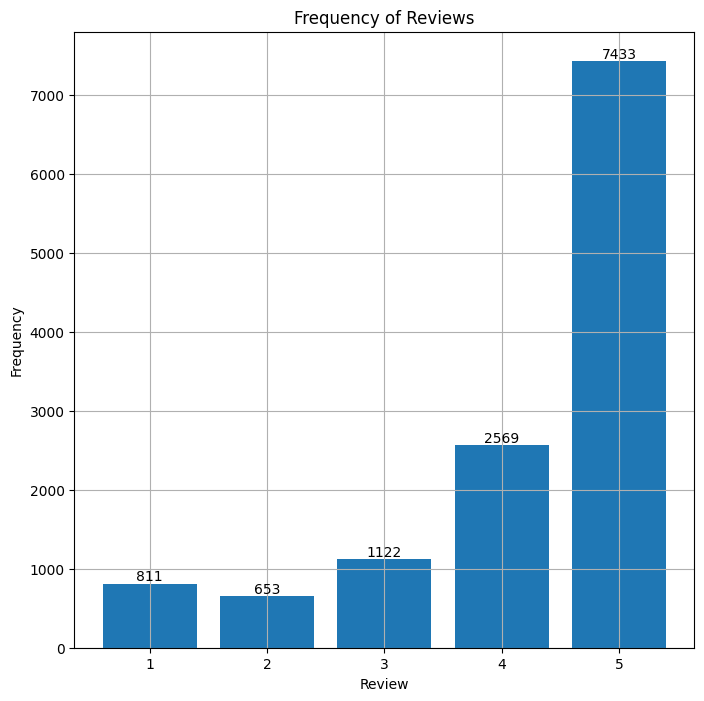

In [21]:
fig, ax = plt.subplots(figsize=(8, 8))
plt.grid(True)
bars = ax.bar(df_train['review'].value_counts(ascending=True).keys(), df_train['review'].value_counts(ascending=True))
ax.set_title('Frequency of Reviews')
ax.set_xlabel('Review')
ax.set_ylabel('Frequency')
ax.bar_label(bars)
plt.show()

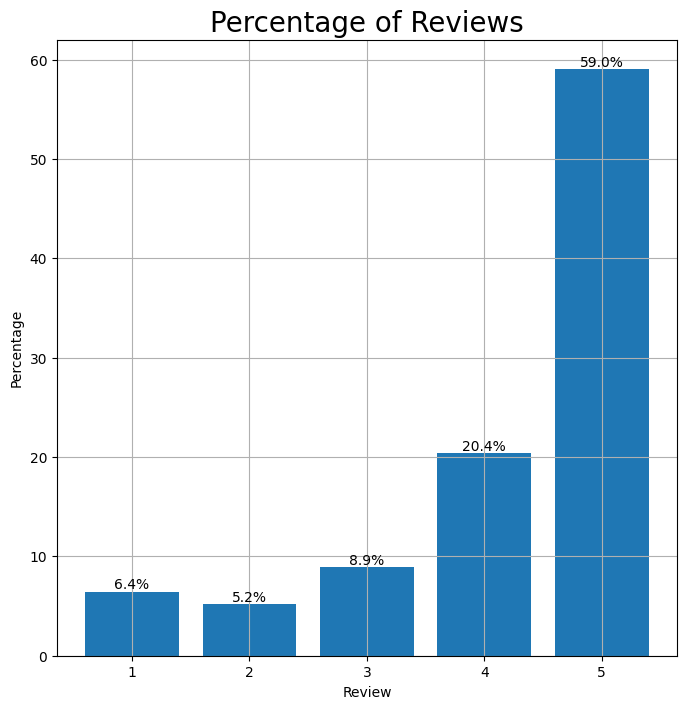

In [17]:
#Show a barplot by Percentages
fig, ax = plt.subplots(figsize=(8, 8))
bars = ax.bar(df_train['review'].value_counts(ascending=True).keys(), (df_train['review'].value_counts(ascending=True))/(df_train['review'].value_counts(ascending=True).sum())*100)

# Set the bar labels (percentages) to be displayed above the bars
ax.bar_label(bars, fmt='%.1f%%')
plt.grid(True)
plt.xlabel('Review')
plt.ylabel('Percentage')
plt.title('Percentage of Reviews', fontsize = 20)
plt.show()

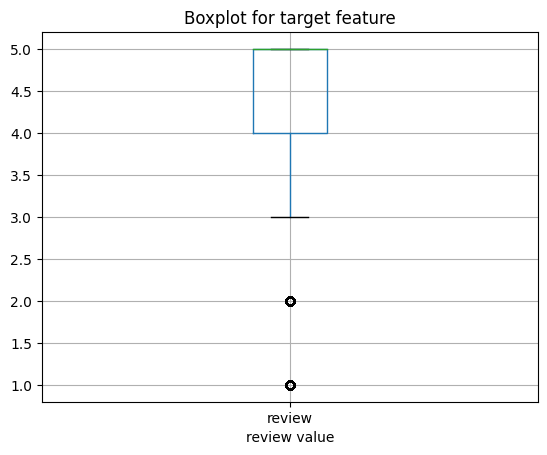

In [18]:
#Create a box plot to check for outliers, median and quartiles
df_train.boxplot(column='review')
plt.xlabel("review value")
plt.title("Boxplot for target feature")
plt.show()

In [19]:
df_train['review'].describe().T

count    12588.000000
mean         4.204322
std          1.193867
min          1.000000
25%          4.000000
50%          5.000000
75%          5.000000
max          5.000000
Name: review, dtype: float64

## Key Findings:
- The Dataset is unbalanced. Having 79.4% of the entries with a High/Postive review [4, 5]. Only 11.6% of the entries have a Low/Negative review [1, 2]. And 8.9% of the entries reviews are neutral [3]
- The Dataset review target feature is biased. Having the 25% Quartile above 4, and 50% and 75% Quartiles on 5. 
- The entries on the dataset with a low review [1, 2] are considered as outliers on the boxplot.

# Univariate EDA

## Fiction Category

In [31]:
df_train['fiction_category'].unique()

array([0, 1])

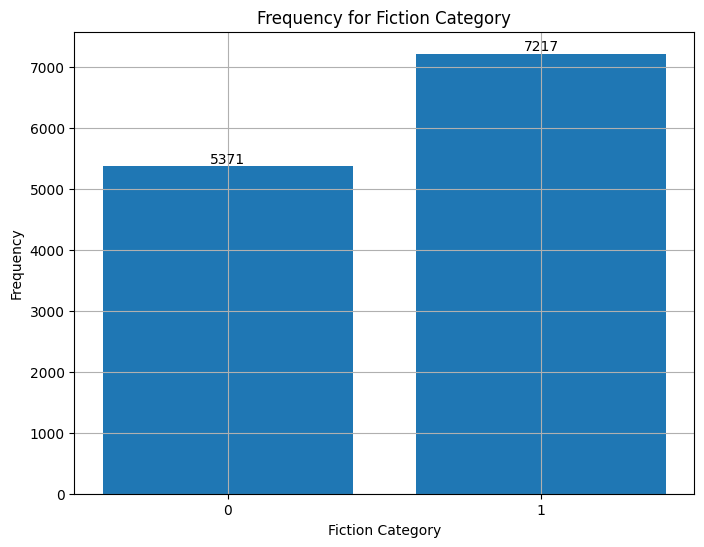

In [41]:
fig, ax = plt.subplots(figsize=(8, 6))
plt.grid(True)
binary_labels = [format(val, 'b') for val in df_train['fiction_category'].unique()]
bars = ax.bar(df_train['fiction_category'].unique(), height=df_train['fiction_category'].value_counts(ascending=True))
plt.xticks(df_train['fiction_category'].unique(), binary_labels)
ax.set_title('Frequency for Fiction Category')
ax.set_xlabel('Fiction Category')
ax.set_ylabel('Frequency')
ax.bar_label(bars)
plt.show()

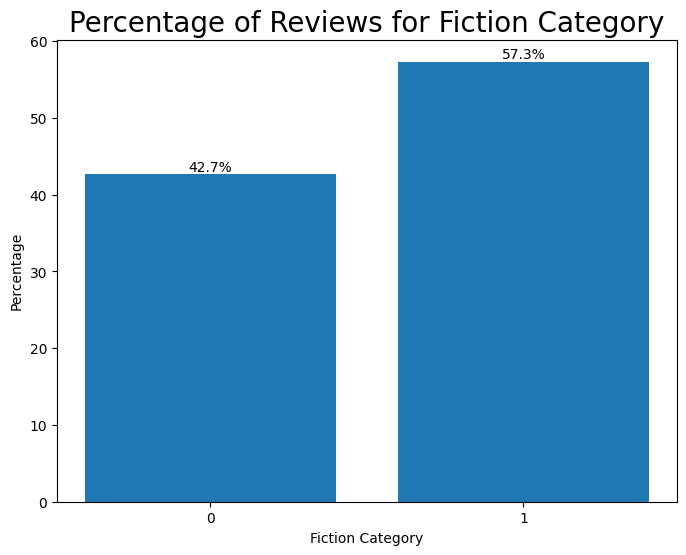

In [42]:
#Show a barplot by Percentages
category_percetage = df_train['fiction_category'].value_counts(ascending=True)/df_train['fiction_category'].value_counts(ascending=True).sum()*100

fig, ax = plt.subplots(figsize=(8, 6))
bars = ax.bar(df_train['fiction_category'].unique(), category_percetage)

# Set the bar labels (percentages) to be displayed above the bars
ax.bar_label(bars, fmt='%.1f%%')

plt.xticks(df_train['fiction_category'].unique(), binary_labels)
plt.xlabel('Fiction Category')
plt.ylabel('Percentage')
plt.title('Percentage of Reviews for Fiction Category', fontsize = 20)
plt.show()

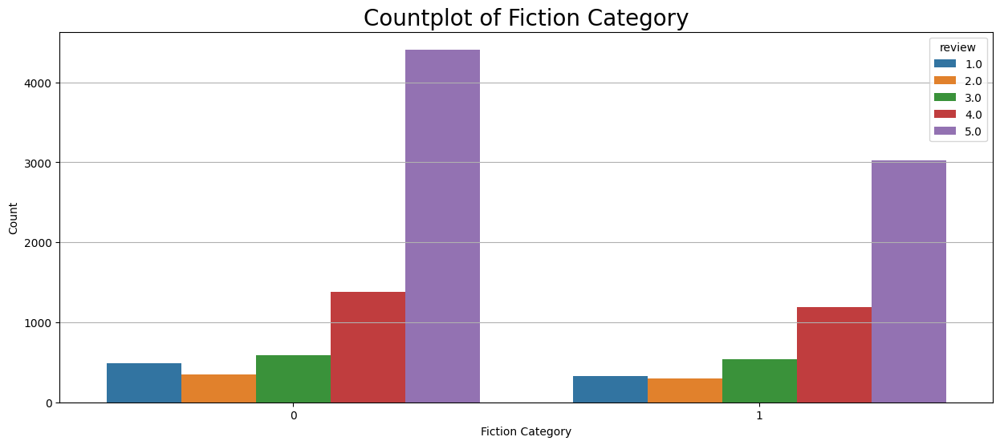

In [46]:
plt.figure(figsize=(15, 6))
plt.grid(True)
sns.countplot(data=df_train, x ='fiction_category', hue='review')
plt.xlabel('Fiction Category')
plt.ylabel('Count')
plt.title('Countplot of Fiction Category', fontsize = 20)
plt.show()

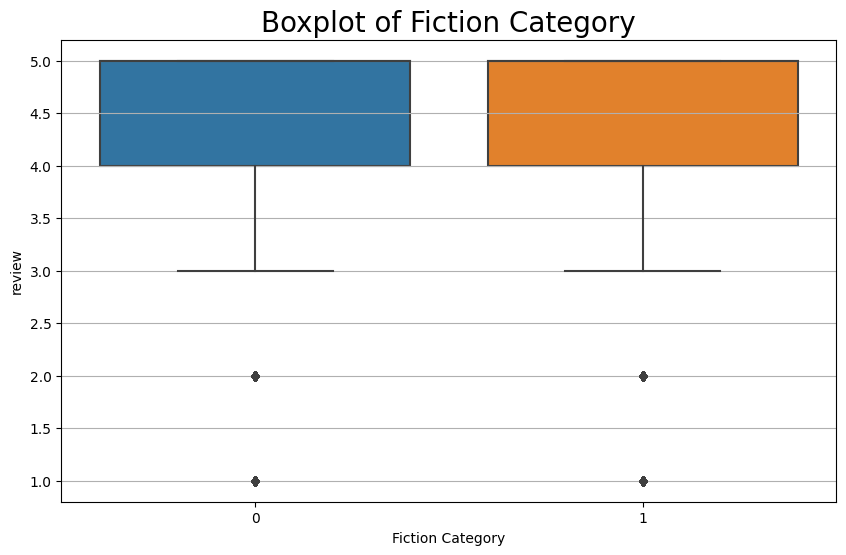

In [49]:
plt.figure(figsize=(10, 6))  # Set the figure size
plt.grid(True)
sns.boxplot(x='fiction_category', y='review', data=df_train)
plt.xlabel('Fiction Category')
plt.title('Boxplot of Fiction Category', fontsize = 20)
plt.show()

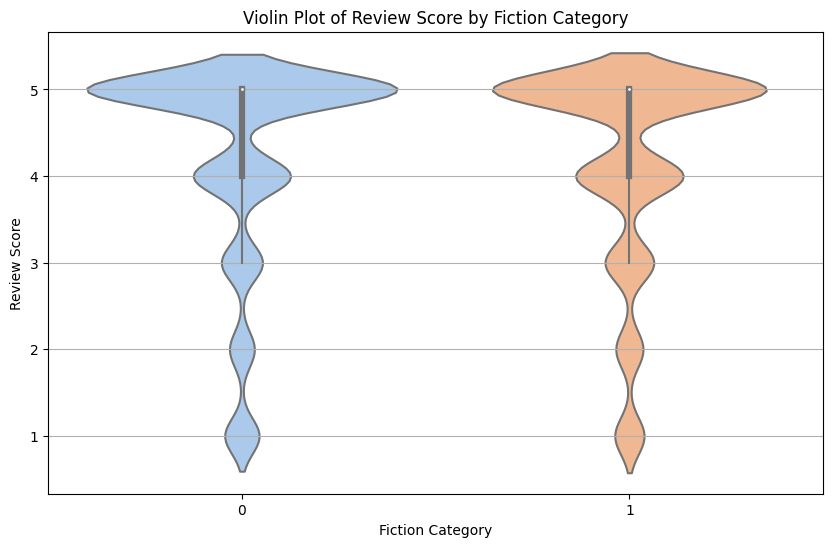

In [52]:
plt.figure(figsize=(10, 6))
plt.grid(True)
sns.violinplot(x='fiction_category', y='review', data=df_train, palette='pastel')
plt.xlabel('Fiction Category')
plt.ylabel('Review Score')
plt.title('Violin Plot of Review Score by Fiction Category')
plt.show()

### Key Findings for Categories:

- Fiction and Non-Fiction Categories contains reviews values in the 5 Review Socores [1, 2, 3, 4, 5]. All of the are biased to high review score.
- Fiction and Non-Fiction categories have the lower quartile limit in Rating of 4 and minimum values of 3, but with outliers in 1 and 2 score reviews groups.
- Fiction is most rated category. This category is biased to High review scores, having the median on 5. And the 25% quartile on 4.

## Published Year

In [53]:
pub_year = df_train[['published_year','review']]
pub_year.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12588 entries, 3268 to 2317
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   published_year  12588 non-null  int64  
 1   review          12588 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 295.0 KB


In [54]:
pub_year = pub_year.groupby('published_year')['review'].agg(['mean', 'count']).reset_index()
pub_year

,published_year,mean,count
0,2004,4.140320,2309
1,2005,4.182574,2525
2,2006,4.055108,1615
3,2007,4.177352,1201
4,2008,4.251634,918
5,2009,4.259843,1270
6,2010,4.171941,948
7,2011,4.270106,659
8,2012,4.509567,993
9,2013,4.513333,150


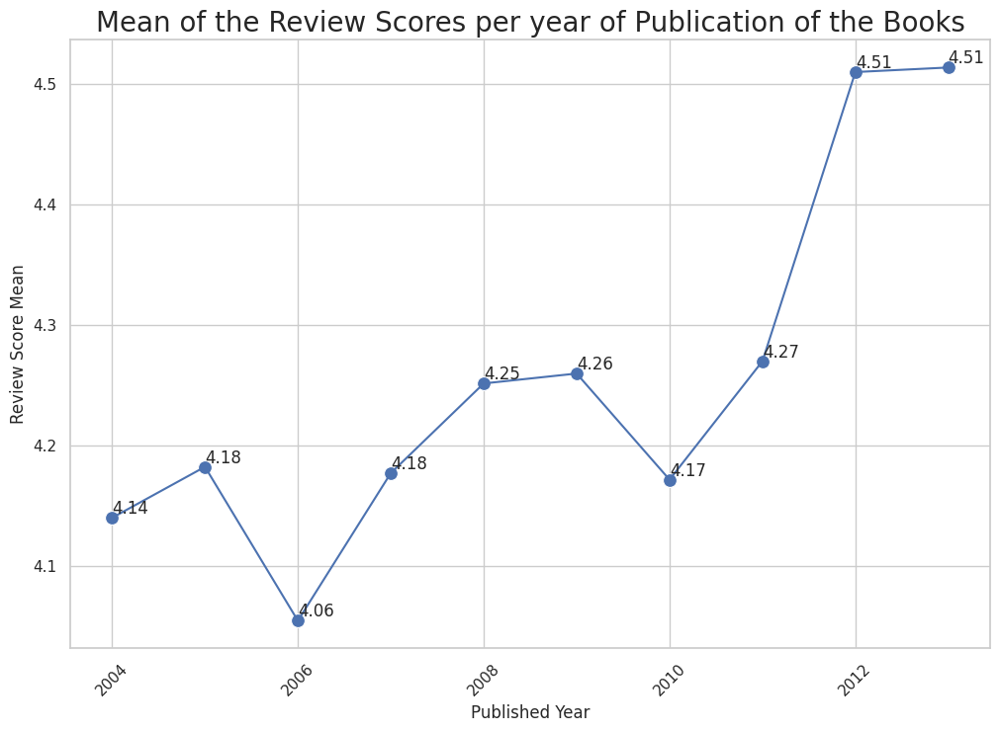

In [62]:
sns.set(style="whitegrid") 
plt.figure(figsize=(12, 8)) 

sns.lineplot(x=pub_year['published_year'], y=pub_year['mean'], linestyle='-')

sns.scatterplot(x=pub_year['published_year'], y=pub_year['mean'], color='b', s=100)

for i, row in pub_year.iterrows():
    plt.text(row['published_year'], row['mean'], f'{row["mean"]:.2f}', ha='left', va='bottom')

plt.xlabel('Published Year')
plt.ylabel('Review Score Mean')
plt.title('Mean of the Review Scores per year of Publication of the Books', fontsize=20)
plt.xticks(rotation=45)
plt.show()

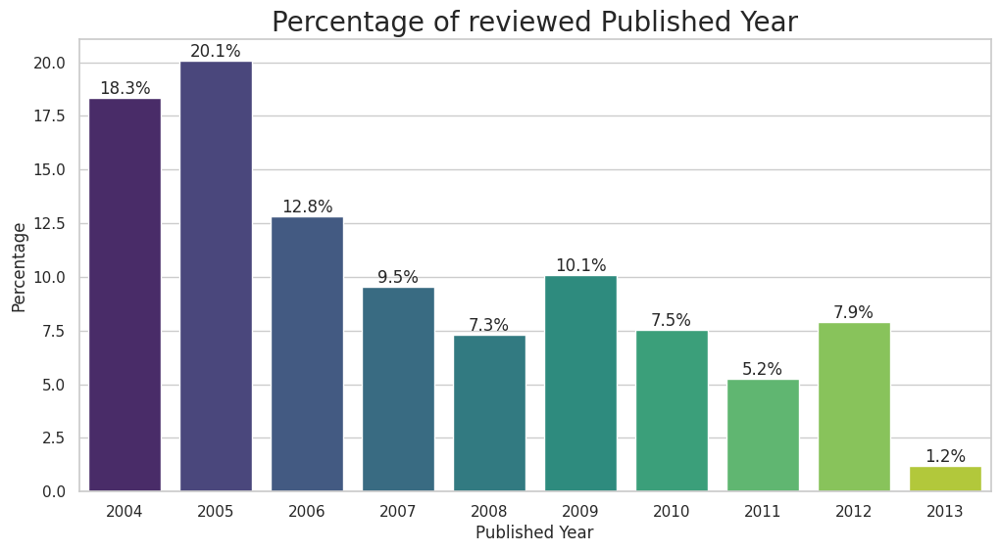

In [63]:
pub_year_percentage = (pub_year['count'] / pub_year['count'].sum()) * 100

sns.set(style="whitegrid") 
plt.figure(figsize=(12, 6))

ax = sns.barplot(x=pub_year['published_year'], y=pub_year_percentage, palette="viridis")

for bar, percentage in zip(ax.patches, pub_year_percentage):
    ax.annotate(f'{percentage:.1f}%', (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='bottom')

plt.xlabel('Published Year')
plt.ylabel('Percentage')
plt.title('Percentage of reviewed Published Year', fontsize=20)

plt.show()

Published Year Feature penalize books with less time of beign published when the review is done. For example, books published on 2013 would have more entries if the dataset. This is explained in the previous Barplot, where older books have the most quantity of reviews.

Published Year feature is not considered for the Model Training and Testing.

In [64]:
df_train = df_train.drop(['published_year'], axis=1)
X_train = X_train.drop(['published_year'], axis=1)

## Helpfulness

In [66]:
df_train.sample(5)

,fiction_category,top_publisher,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
11509,0,0,2011,0.500000,purchase book exact book match description off...,0.8932,9.9,23,5.0
15533,1,0,2007,1.000000,read book already read impacting book think ev...,0.6486,3.6,160,5.0
11177,0,0,2013,0.000000,felt like book much useful information would r...,0.7845,5.0,11,2.0
4871,0,1,2011,0.333333,found walking technique presented author physi...,0.8809,7.0,102,1.0
8158,0,1,2012,1.000000,purchased book unsure would find admit agree e...,0.8176,6.8,24,5.0


In [67]:
df_train['helpfulness'].describe().T

count    12588.000000
mean         0.819897
std          0.315379
min          0.000000
25%          0.750000
50%          1.000000
75%          1.000000
max          1.000000
Name: helpfulness, dtype: float64

In [70]:
#Create a box plot to check for outliers, median and quartiles
fig = px.box(df_train, y='helpfulness')

fig.update_xaxes(title_text='')
fig.update_layout(
    title='Boxplot for Helpfulness Feature',
    title_x=0.5        
)

fig.show()

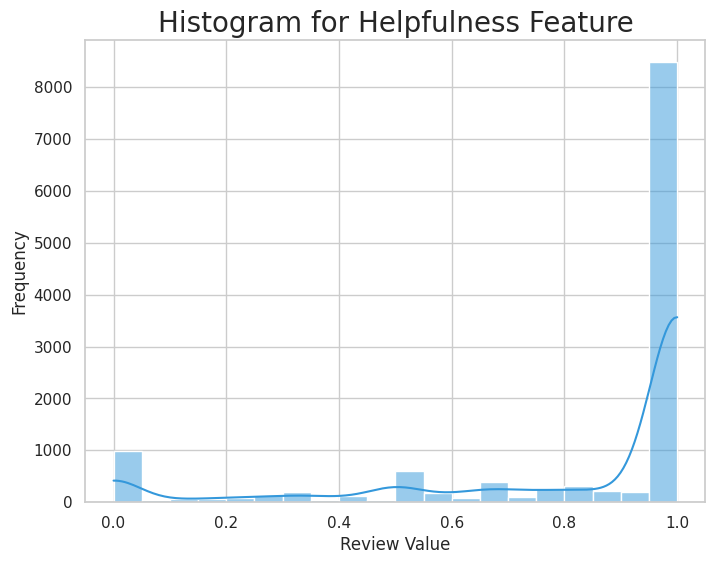

In [71]:
plt.figure(figsize=(8, 6))
sns.histplot(df_train['helpfulness'], bins=20, kde=True, color='#3498db')
plt.xlabel("Review Value")
plt.ylabel("Frequency")
plt.title("Histogram for Helpfulness Feature", fontsize=20)
plt.show()

In [72]:
#Correlation Analysis 
df_train[['helpfulness','review']].corr().style.background_gradient(cmap='Blues')

,helpfulness,review
helpfulness,1.000000,0.288342
review,0.288342,1.000000


In [73]:

# Create an interactive box plot using Plotly
fig = px.box(df_train, x='review', y='helpfulness')

fig.update_layout(
    title='Box Plot of Review vs Helpfulness',
    xaxis_title='Review',
    yaxis_title='Helpfulness',
    title_x=0.5
)

# Show the interactive plot
fig.show()

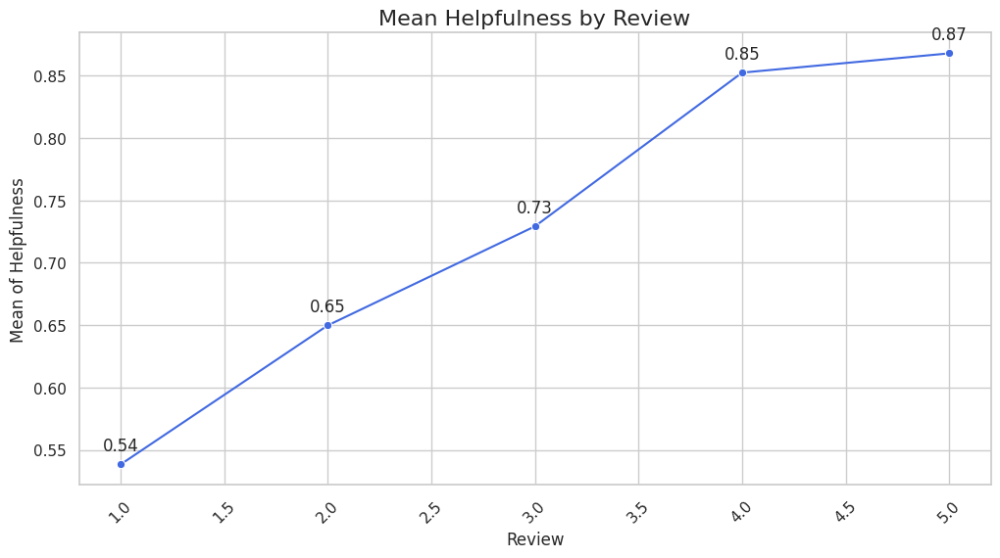

In [74]:
helpfulness_by_review = df_train.groupby('review')['helpfulness'].mean()

plt.figure(figsize=(12, 6))
sns.lineplot(x=helpfulness_by_review.index, y=helpfulness_by_review.values, marker='o', linestyle='-', color='royalblue')
plt.xlabel('Review')
plt.ylabel('Mean of Helpfulness')
plt.title('Mean Helpfulness by Review', fontsize=16)
plt.grid(True)

plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Add labels to each point
for x, y in zip(helpfulness_by_review.index, helpfulness_by_review.values):
    plt.annotate(f'{y:.2f}', (x, y), textcoords='offset points', xytext=(0,10), ha='center')

plt.show()

<Figure size 1200x600 with 0 Axes>

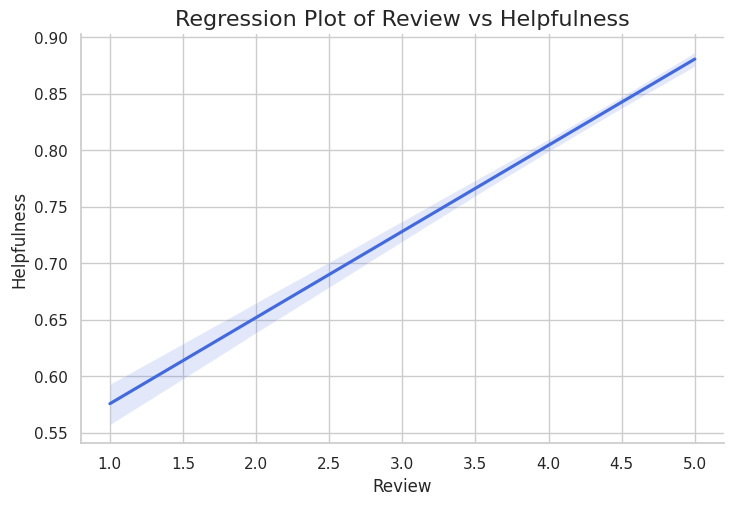

In [75]:
plt.figure(figsize=(12, 6))
sns.lmplot(x='review', y='helpfulness', data=df_train, height=5, aspect=1.5, scatter=False, line_kws={"color": "royalblue"})
plt.xlabel('Review')
plt.ylabel('Helpfulness')
plt.title('Regression Plot of Review vs Helpfulness', fontsize=16)
plt.grid(True)
plt.show()

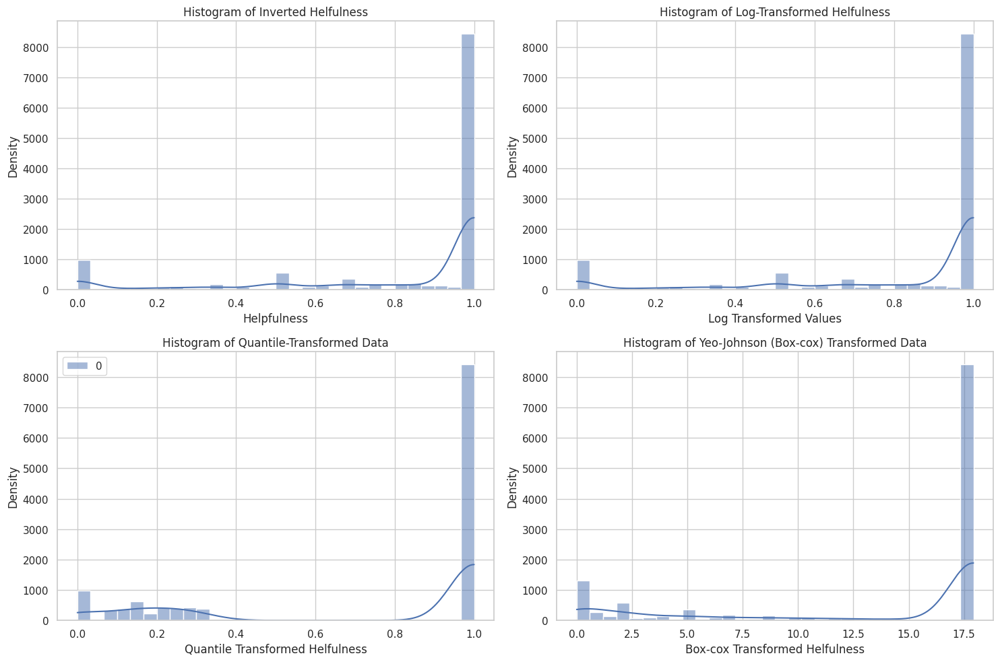

In [93]:
# Log transformation can help to reduce the bias towards to 1 
small_constant_log = 1e-10

helpfulness_data =  df_train['helpfulness']#1 - np.abs(df_train['helpfulness'])

helpfulness_log = helpfulness_data # np.log(helpfulness_data + small_constant_log) 

# Arcsin Transformation
small_constant_arcsin = 1e-5
helpfulness_arcsinh  = np.arcsinh(helpfulness_data)

#Box-Cox Transformation
helpfulness_box_cox, lambda_bestfit = stats.yeojohnson(helpfulness_data)

helpfulness_reshaped = df_train['helpfulness'].values.reshape(-1, 1)
qt = QuantileTransformer(output_distribution='uniform')
helpfulness_quantile = qt.fit_transform(helpfulness_reshaped)

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

sns.set(style="whitegrid")

sns.histplot(helpfulness_data, bins=30, kde=True, ax=axes[0,0])
axes[0,0].set_xlabel('Helpfulness')
axes[0,0].set_ylabel('Density')
axes[0,0].set_title('Histogram of Inverted Helfulness')

sns.histplot(helpfulness_log, bins=30, kde=True, ax=axes[0,1])
axes[0,1].set_xlabel('Log Transformed Values')
axes[0,1].set_ylabel('Density')
axes[0,1].set_title('Histogram of Log-Transformed Helfulness')

# Create a histogram plot for the arcsin-transformed data
sns.histplot(helpfulness_quantile, bins=30, kde=True, ax=axes[1,0])
axes[1,0].set_xlabel('Quantile Transformed Helfulness')
axes[1,0].set_ylabel('Density')
axes[1,0].set_title('Histogram of Quantile-Transformed Data')


# Create a histogram plot for the arcsin-transformed data
sns.histplot(helpfulness_box_cox, bins=30, kde=True, ax=axes[1,1])
axes[1,1].set_xlabel('Box-cox Transformed Helfulness')
axes[1,1].set_ylabel('Density')
axes[1,1].set_title('Histogram of Yeo-Johnson (Box-cox) Transformed Data')

plt.tight_layout()
plt.show()

NOTAS: Log y raiz y box cox son para variables con sesgo positivo. No funcionan en helfulness

Para esta variable debo invertirla, restarle 1. Y a esa función le aplico una transformación de ese tipo Log y raiz y box cox.

In [94]:
#Create a box plot to check for outliers, median and quartiles
fig = px.box(helpfulness_quantile)

fig.update_xaxes(title_text='')
fig.update_layout(
    title='Boxplot for Helpfulness Hiperbolic Acrsing Transformed Feature',
    title_x=0.5        
)

fig.show()

In [111]:
helpfulness_quantile

array([[1.        ],
       [0.1981982 ],
       [1.        ],
       ...,
       [0.16066066],
       [0.25425425],
       [0.09280013]])

In [103]:
len(df_train['review'].values)

12588

In [115]:
np.array(helpfulness_quantile).flatten()

array([1.        , 0.1981982 , 1.        , ..., 0.16066066, 0.25425425,
       0.09280013])

In [113]:
helpfulness_log

3268     1.000000
2185     0.600000
15549    1.000000
10502    1.000000
10853    1.000000
           ...   
7445     1.000000
11290    1.000000
11130    0.500000
5564     0.750000
2317     0.217391
Name: helpfulness, Length: 12588, dtype: float64

In [100]:
len(helpfulness_log)

12588

In [116]:

# Create an interactive box plot using Plotly
fig = px.box(x=df_train['review'], y=np.array(helpfulness_quantile).flatten())

fig.update_layout(
    title='Box Plot of Review vs Transformed Hyperbolic Arcsin Helpfulness',
    xaxis_title='Review',
    yaxis_title='Helpfulness',
    title_x=0.5
)

# Show the interactive plot
fig.show()

In [117]:
df_train['helpfulness_quantile'] = helpfulness_quantile
df_train.sample(5, random_state=5)

,fiction_category,top_publisher,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review,helpfulness_quantile
5334,0,0,2010,1.000,son adores book pull every night point picture...,0.8555,2.2,20,5.0,1.000000
15053,0,0,2012,1.000,ellie musical biographer set write semi famous...,-0.5498,8.0,215,5.0,1.000000
7535,0,0,2009,0.875,book written connecticut journalist certainly ...,-0.2782,7.8,85,4.0,0.302302
9498,1,0,2011,1.000,love world eoin colfer created novel corporate...,0.9682,9.2,84,4.0,1.000000
2515,1,0,2012,1.000,excellent book high level concept felt enjoyin...,0.8225,8.0,16,5.0,1.000000


### Key Findings for helpfulness

- Reviews with a high review score are found more helpfull than reviews with low review score.
- Mean of the helpfulness and review have a linear relationship.
- Helpfulness vs review regression plot confirms the linear relation between the variables.

## Review_Year

In [121]:
rev_year = df_train[['review_year','review']]
rev_year.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12588 entries, 3268 to 2317
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   review_year  12588 non-null  int64  
 1   review       12588 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 295.0 KB


In [122]:
rev_year = rev_year.groupby('review_year')['review'].agg(['mean', 'count']).reset_index()

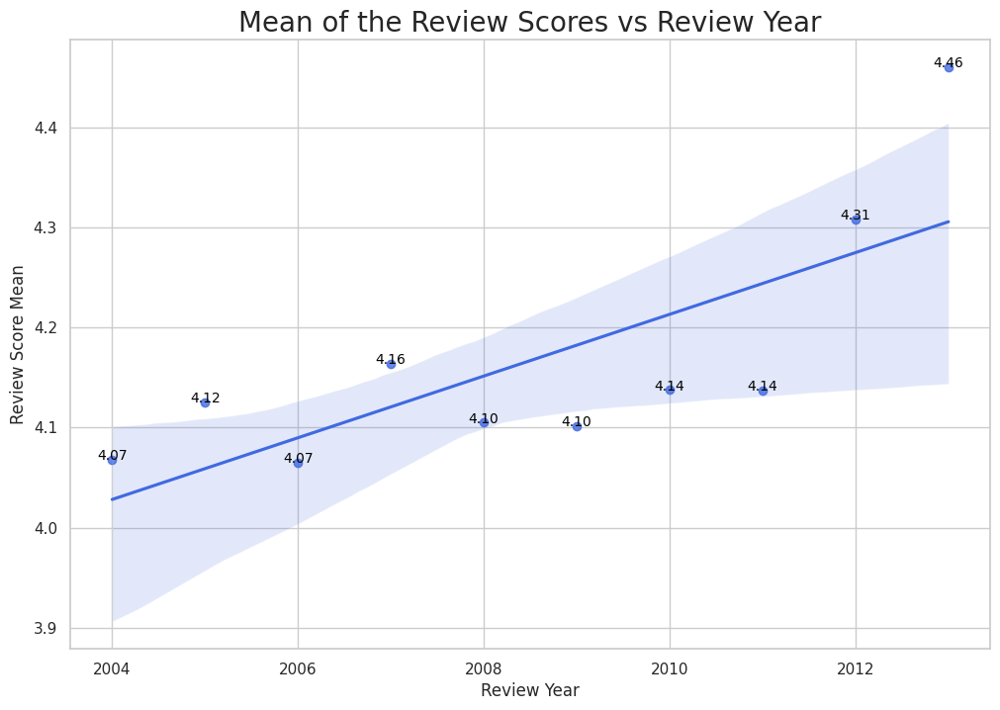

In [125]:
plt.figure(figsize=(12, 8))
ax = sns.regplot(data=rev_year, x='review_year', y='mean', color='royalblue')
plt.xlabel('Review Year')
plt.ylabel('Review Score Mean')
plt.title('Mean of the Review Scores vs Review Year', fontsize=20)
plt.grid(True)

# Add labels to the points
for line in range(0, rev_year.shape[0]):
    ax.text(rev_year['review_year'][line], rev_year['mean'][line], f'{rev_year["mean"][line]:.2f}', horizontalalignment='center', fontsize=10, color='black')

plt.show()

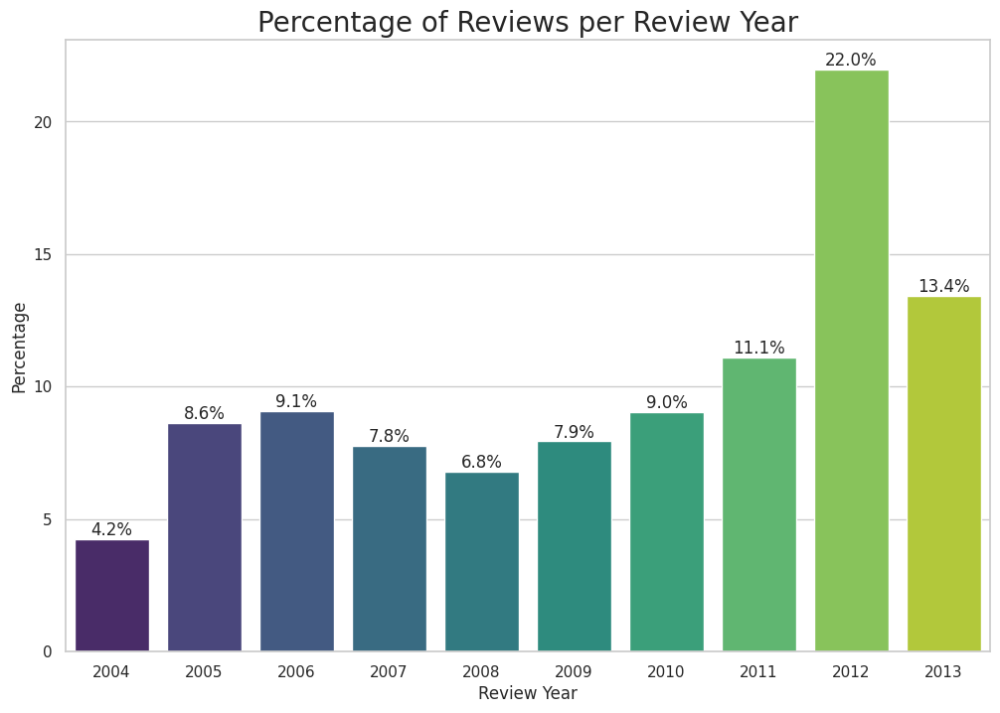

In [126]:
rev_year_percentage = (rev_year['count'] / rev_year['count'].sum()) * 100

sns.set(style="whitegrid")  # Establecer el estilo de la cuadrícula
plt.figure(figsize=(12, 8))  # Establecer el tamaño de la figura

# Crear el gráfico de barras con Seaborn
ax = sns.barplot(x=rev_year['review_year'], y=rev_year_percentage, palette="viridis")

# Agregar etiquetas de porcentaje en las barras
for bar, percentage in zip(ax.patches, rev_year_percentage):
    ax.annotate(f'{percentage:.1f}%', (bar.get_x() + bar.get_width() / 2, bar.get_height()), ha='center', va='bottom')

# Personalizar etiquetas y título
plt.xlabel('Review Year')
plt.ylabel('Percentage')
plt.title('Percentage of Reviews per Review Year', fontsize=20)

# Mostrar el gráfico
plt.show()

### Removing Review Year

This column is removed as the goal of the model is to be used to predict newer entries in the future. Tools and Technologies changes with the time. Review scores are often more dependent on the content of the review, including sentiments expressed, specific aspects of the book discussed, and the writing style. The Scope of the current hypotesis search to predict the review score based on the on the content of the review itself, not the time at which the review was written.

In [128]:
df_train = df_train.drop(['review_year'], axis=1)
X_test = X_test.drop(['review_year'], axis=1)

## Publisher

In [129]:
df_train.sample(2)

,fiction_category,top_publisher,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review,helpfulness_quantile
15692,1,1,1.0,beginning wonderful novel clear sena jeter nas...,0.9928,12.2,175,5.0,1.0
8168,1,0,1.0,good book think good first book,0.7003,2.8,6,4.0,1.0


In [133]:
df_train['top_publisher'].value_counts()

top_publisher
0    8820
1    3768
Name: count, dtype: int64

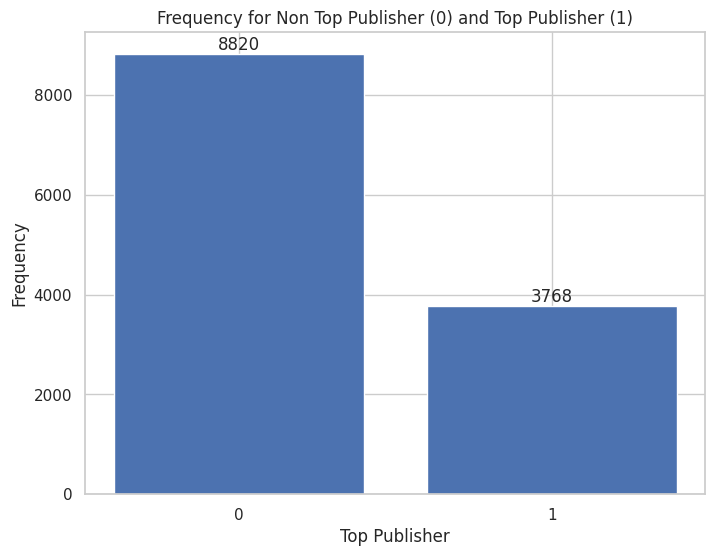

In [137]:
fig, ax = plt.subplots(figsize=(8, 6))
plt.grid(True)
binary_labels = [format(val, 'b') for val in df_train['top_publisher'].value_counts(ascending=False).keys()]
bars = ax.bar(df_train['top_publisher'].unique(), height=df_train['top_publisher'].value_counts(ascending=False))
plt.xticks(df_train['top_publisher'].unique(), binary_labels)
ax.set_title('Frequency for Non Top Publisher (0) and Top Publisher (1)')
ax.set_xlabel('Top Publisher')
ax.set_ylabel('Frequency')
ax.bar_label(bars)
plt.show()

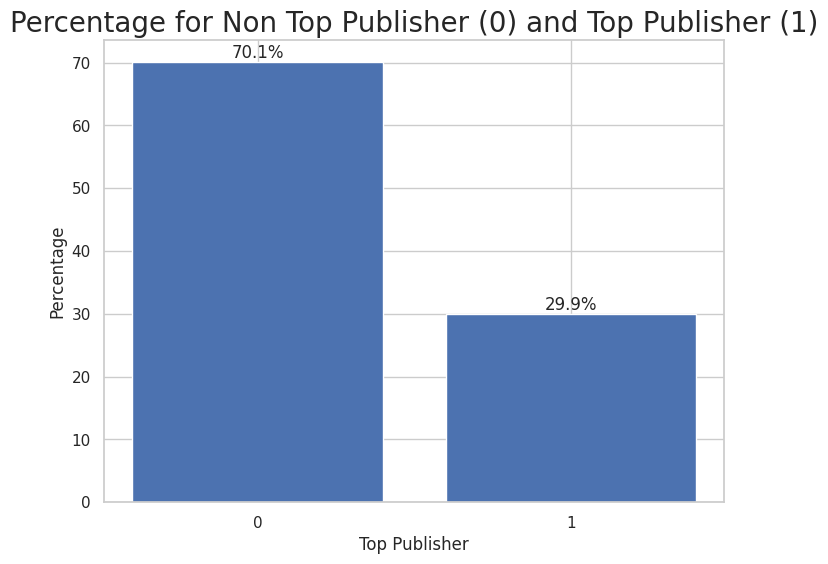

In [143]:
#Show a barplot by Percentages
category_percetage = df_train['top_publisher'].value_counts(ascending=False)/df_train['top_publisher'].value_counts(ascending=False).sum()*100

fig, ax = plt.subplots(figsize=(8, 6))
bars = ax.bar(df_train['top_publisher'].value_counts(ascending=False).keys(), category_percetage)

# Set the bar labels (percentages) to be displayed above the bars
ax.bar_label(bars, fmt='%.1f%%')

plt.xticks(df_train['top_publisher'].value_counts(ascending=False).keys(), binary_labels)
plt.xlabel('Top Publisher')
plt.ylabel('Percentage')
plt.title('Percentage for Non Top Publisher (0) and Top Publisher (1)', fontsize = 20)
plt.show()


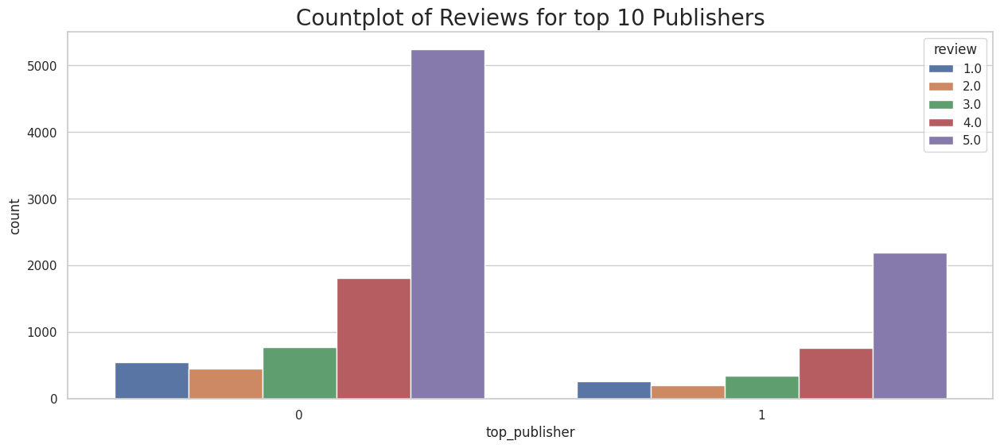

In [145]:
plt.figure(figsize=(15, 6))
sns.countplot(data=df_train, x = 'top_publisher', hue='review')
plt.title('Countplot of Reviews for top 10 Publishers', fontsize = 20)
plt.show()

In [146]:
fig = px.box(df_train, x='top_publisher', y='review')
fig.update_xaxes(categoryorder='total descending')
fig.update_layout(
    title='Interactive Box Plot of Review by Publisher',
    xaxis_title='Publisher',
    yaxis_title='Review'
)
fig.show()

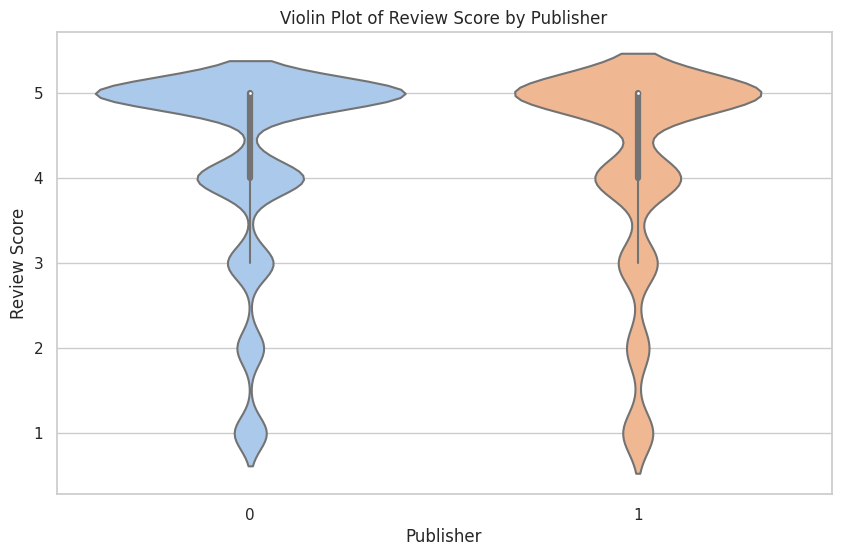

In [148]:

plt.figure(figsize=(10, 6))
sns.violinplot(x='top_publisher', y='review', data=df_train, palette='pastel')
plt.xlabel('Publisher')
plt.ylabel('Review Score')
plt.title('Violin Plot of Review Score by Publisher')
plt.show()


### Key Findings for Publisher

- Non-Top and Top Publishers have a Review Score biased to high values. Both of them have the 25% percentile above 4. Having the median value and 75% percentile on 5. 
- Non-Top and Top Publishers have values on the 5 possible review scores. As it contains valid variability, this feature is kept.

## Compound Sentiment

This variable is the result of applying vader lexicon with NLTK library to the cleaned text review from the Dataset.

In [137]:
df_train.sample(2)

,categories,publisher,published_year,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
4869,Other,Other,2004,2012,1.0,book take back time mystery truly mystery fun ...,0.8591,5.5,22,5.0
4028,History,Other,2008,2010,1.0,seeing movie memoires geisha curious learn gei...,0.9705,5.8,71,5.0


In [138]:
df_train['compound_sentiment'].describe().T

count    12587.000000
mean         0.626456
std          0.513518
min         -0.998500
25%          0.557400
50%          0.855500
75%          0.951650
max          0.999800
Name: compound_sentiment, dtype: float64

compound_sentiment range goes from -1 to 1. As more near is the value to 1, more positive is the sentiment extracted from the text. And as more near to -1 is the value,
more negative is the sentiment predicted from the value.

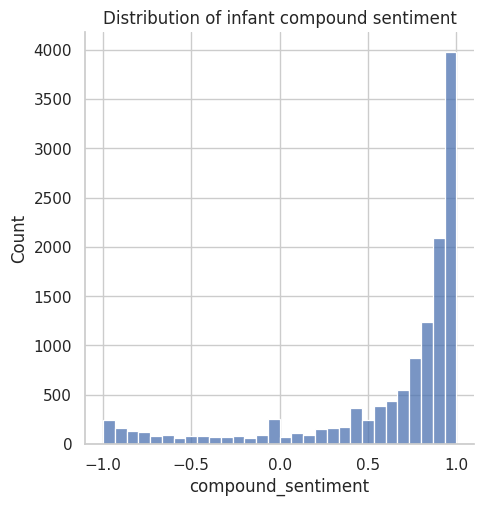

In [139]:
sns.displot(df_train['compound_sentiment'], bins=30)

plt.title('Distribution of infant compound sentiment')

plt.show()

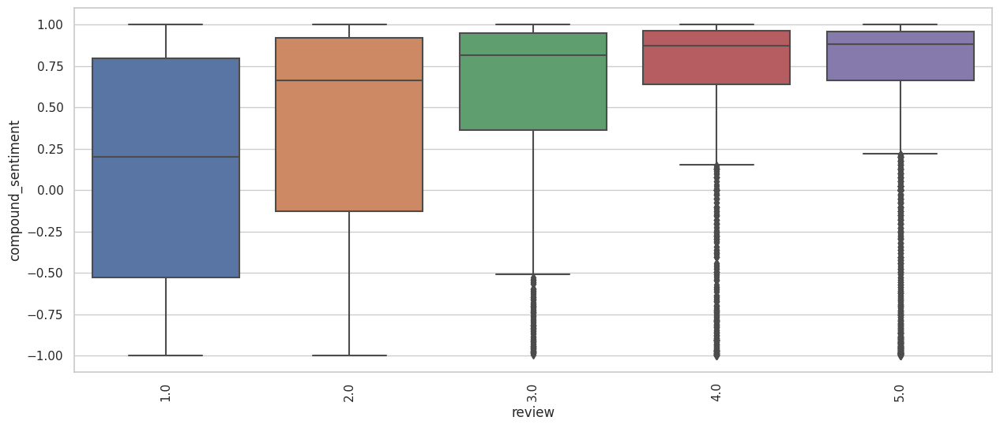

In [140]:
plt.figure(figsize=(15, 6)) 
sns.boxplot(x='review', y='compound_sentiment', data=df_train)
plt.xticks(rotation=90)
plt.show()

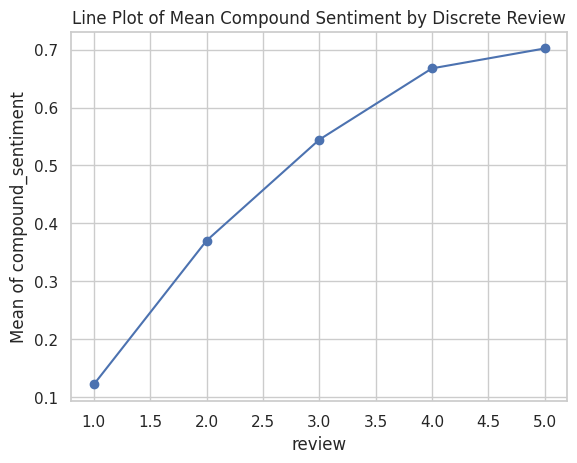

In [141]:
mean_by_review = df_train.groupby('review')['compound_sentiment'].mean()
mean_by_review.plot(kind='line', marker='o', linestyle='-')
plt.xlabel('review')
plt.ylabel('Mean of compound_sentiment')
plt.title('Line Plot of Mean Compound Sentiment by Discrete Review')
plt.grid(True)
plt.show()

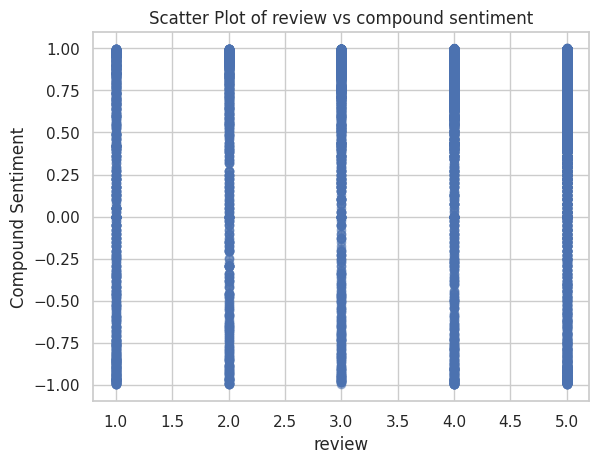

In [142]:
plt.scatter(df_train['review'], df_train['compound_sentiment'], alpha=0.5)
plt.xlabel('review')
plt.ylabel('Compound Sentiment')
plt.title('Scatter Plot of review vs compound sentiment')
plt.show()

In [143]:
df_train[['compound_sentiment', 'review']].corr().style.background_gradient(cmap='Blues')

,compound_sentiment,review
compound_sentiment,1.000000,0.287268
review,0.287268,1.000000


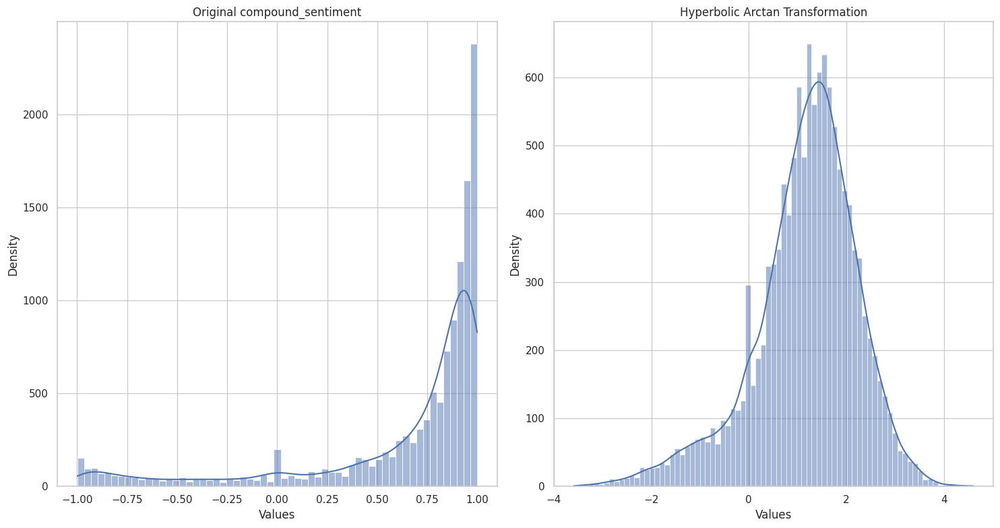

In [144]:
# Apply transformation
fig, axes = plt.subplots(1, 2, figsize=(15, 8))
data = df_train['compound_sentiment']

sns.set(style="whitegrid")

sns.histplot(data, kde=True, ax=axes[0])
axes[0].set_title('Original compound_sentiment')
axes[0].set_ylabel('Density')
axes[0].set_xlabel('Values')

compound_sentiment_arctanh_transformed = np.arctanh(df_train['compound_sentiment'])
sns.histplot(compound_sentiment_arctanh_transformed, kde=True, ax=axes[1])
axes[1].set_title('Hyperbolic Arctan Transformation')
axes[1].set_xlabel('Values')
axes[1].set_ylabel('Density')

# compound_sentiment_boxcox_transformed, _ = stats.boxcox(data)
# sns.histplot(compound_sentiment_boxcox_transformed, kde=True, ax=axes[3])
# axes[2].set_title('Box-Cox Transformation')
# axes[2].set_xlabel('Values')
# axes[2].set_ylabel('Density')

#boxcox failed for negative values

plt.tight_layout()
plt.show()

The arctanh transformation is given by:

$y = \tanh^{-1}(x) = \frac{1}{2} \ln\left(\frac{1 + x}{1 - x}\right)$

Here, x is the original data point, and y is the transformed data point.

Inverse hyperbolic tangent (arctanh) transformation is good an option for making a dataset column with values in the range of -1 to 1 more normally distributed.

In [145]:
# Create an interactive box plot using Plotly
fig = px.box(x=df_train['review'], y=compound_sentiment_arctanh_transformed)

fig.update_layout(
    title='Box Plot of Review vs Transformed Hyperbolic Arctan Compound Sentiment',
    xaxis_title='Review',
    yaxis_title='Compound Sentiment',
    title_x=0.5
)

# Show the interactive plot
fig.show()

In [146]:
df_train['compound_sentiment'] = compound_sentiment_arctanh_transformed
df_train.sample(5)

,categories,publisher,published_year,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
6072,Fiction,Other,2011,2013,1.000000,wish checked one store ordered online care wor...,0.939734,5.4,16,2.0
729,Other,Other,2005,2008,0.666667,read studied book believe good get feeling fil...,1.732069,7.8,74,3.0
2107,Other,Harper Collins,2005,2012,1.000000,recently bought book father read fell love fir...,2.030196,11.8,74,5.0
14903,Fiction,Penguin,2006,2013,1.000000,phone time even bed convenient book time espec...,1.429188,7.0,22,5.0
15721,Other,Other,2005,2013,1.000000,really cute story bear decide going teach gold...,0.730220,7.0,27,5.0


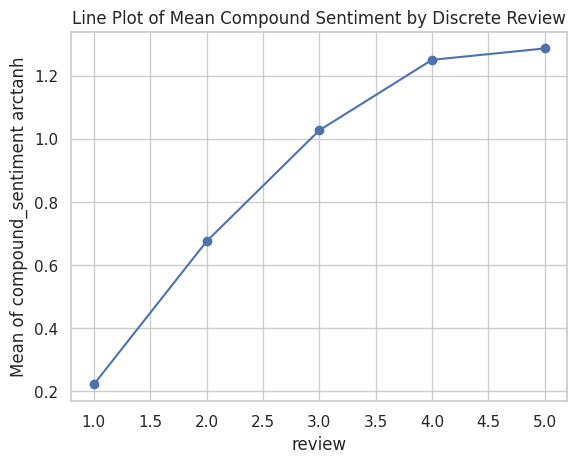

In [147]:
mean_by_review = df_train.groupby('review')['compound_sentiment'].mean()
mean_by_review.plot(kind='line', marker='o', linestyle='-')
plt.xlabel('review')
plt.ylabel('Mean of compound_sentiment arctanh')
plt.title('Line Plot of Mean Compound Sentiment by Discrete Review')
plt.grid(True)
plt.show()

In [148]:
X_test['compound_sentiment'] = np.arctanh(X_test['compound_sentiment'])

### Key Findings for Compound Sentiment

- From the Distribution Plot, it is visible that Compound Sentiment Feature is biased to high levels/positive levels.
- The Boxplot figure shows the relation between review and compound sentiment. For High score reviews, the Compound sentiments tends to increase and be positive. And for Low Review Scores, the sentiment tends to be negative. This can explain the first bullet, because the dataset contains more entries with High Score Values, the positive Compound sentiment will increse.
- The line plot confirms the relationship between review and compound sentiment, plotting the mean of the compound sentiment for each review score. There is a positive relation. When review tends to be high, compound sentiment tends to be 1. 

## Text Complexity

 Flesch-Kincaid Grade Level readability score was used to estimate the readability and complexity of the text based on factors like sentence length and word difficulty

In [149]:
df_train.sample(3)

,categories,publisher,published_year,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
3115,Other,Penguin,2007,2007,0.166667,maybe food great maybe program work never find...,0.811651,2.6,45,1.0
11812,Fiction,Penguin,2006,2013,1.000000,love book especially reading whole series ever...,1.668100,4.7,28,5.0
11511,Other,Other,2004,2006,1.000000,book provides interesting history literature c...,1.041044,14.6,19,5.0


In [150]:
df_train['text_complexity'].describe().T

count    12587.000000
mean         7.276643
std          3.233105
min         -3.100000
25%          5.000000
50%          7.000000
75%          9.200000
max         34.800000
Name: text_complexity, dtype: float64

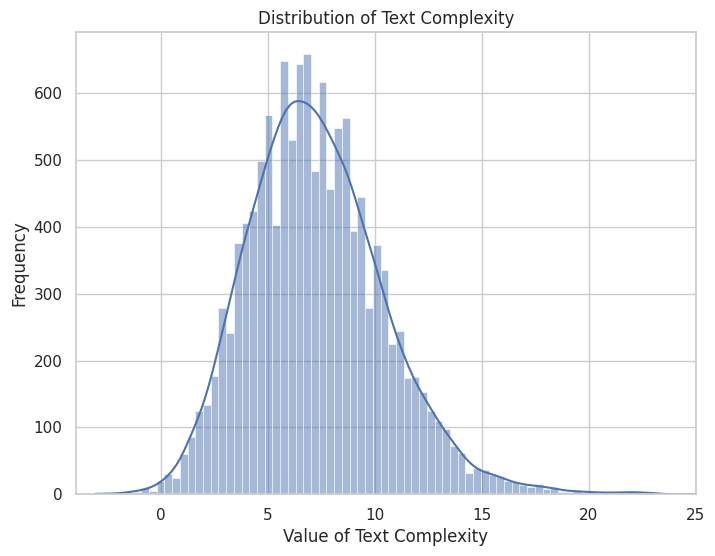

In [151]:
# Plot a histogram to visualize the distribution of the continuous variable
plt.figure(figsize=(8, 6))
sns.histplot(data=df_train, x='text_complexity', kde=True)
plt.title("Distribution of Text Complexity")
plt.xlabel("Value of Text Complexity")
plt.xlim(-4, 25)
plt.ylabel("Frequency")
plt.show()


In [152]:
#Create a box plot to check for outliers, median and quartiles
fig = px.box(df_train, y='text_complexity')

fig.update_xaxes(title_text='')
fig.update_layout(
    title='Boxplot for Text Complexity Feature',
    title_x=0.5        
)

fig.show()

In [153]:

# Create an interactive box plot using Plotly
fig = px.box(df_train, x='review', y='text_complexity')

fig.update_layout(
    title='Box Plot of Review vs Text Complexity',
    xaxis_title='Review',
    yaxis_title='Text Complexity',
    title_x=0.5
)

# Show the interactive plot
fig.show()

<Figure size 1200x600 with 0 Axes>

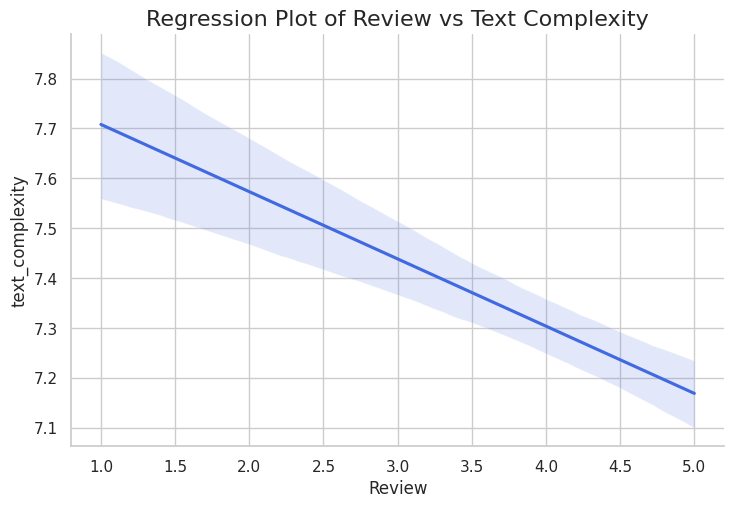

In [154]:
plt.figure(figsize=(12, 6))
sns.lmplot(x='review', y='text_complexity', data=df_train, height=5, aspect=1.5, scatter=False, line_kws={"color": "royalblue"})
plt.xlabel('Review')
plt.ylabel('text_complexity')
plt.title('Regression Plot of Review vs Text Complexity', fontsize=16)
plt.grid(True)
plt.show()

## Word Count

In [155]:
df_train['word_count'].describe().T

count    12587.000000
mean        67.576388
std         87.239336
min          1.000000
25%         18.000000
50%         37.000000
75%         82.000000
max       1460.000000
Name: word_count, dtype: float64

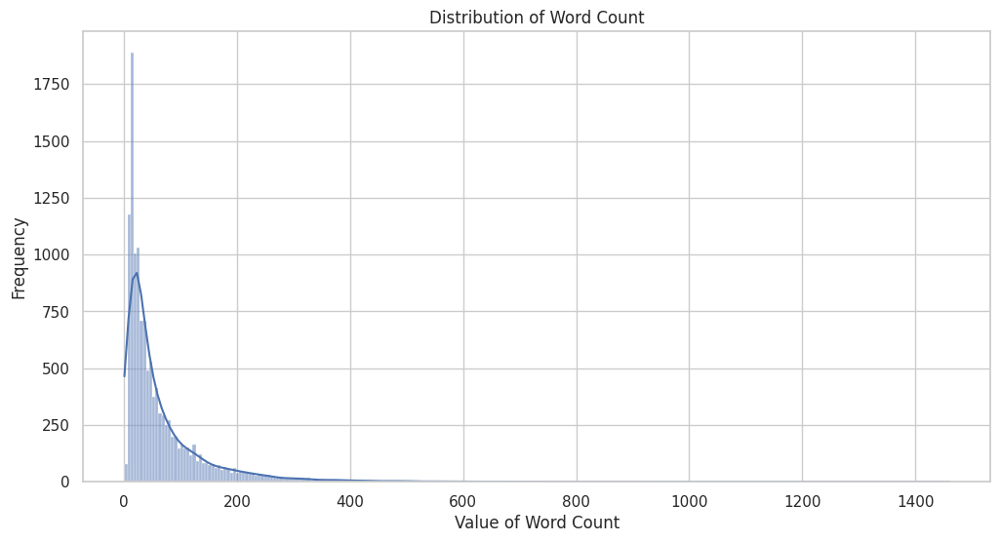

In [156]:
# Plot a histogram to visualize the distribution of the continuous variable
plt.figure(figsize=(12, 6))
sns.histplot(data=df_train, x='word_count', kde=True)
plt.title("Distribution of Word Count")
plt.xlabel("Value of Word Count")
plt.ylabel("Frequency")
plt.show()

In [157]:
df_train[df_train['word_count']>500]['word_count'].value_counts().sum()

68

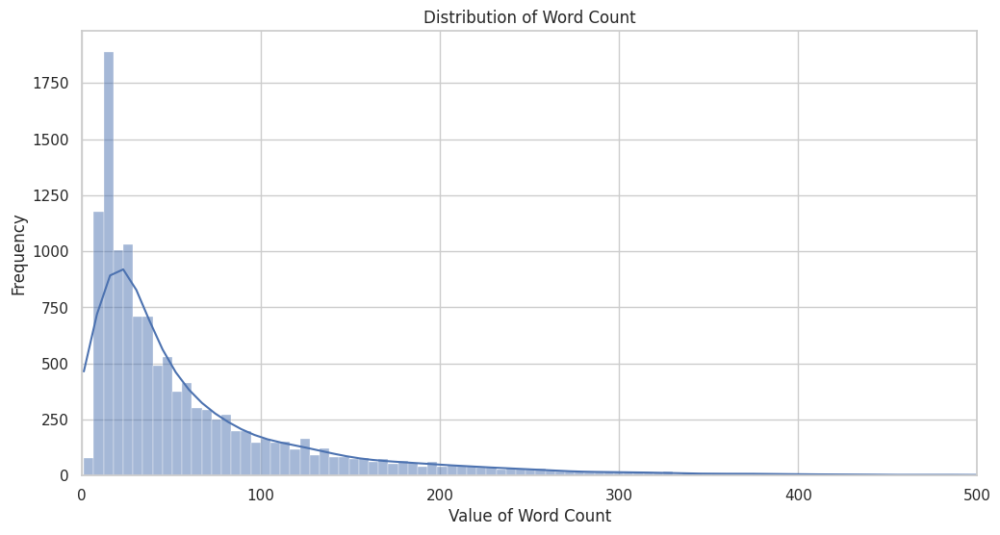

In [158]:
# Plot a histogram to visualize the distribution of the continuous variable
plt.figure(figsize=(12, 6))
sns.histplot(data=df_train, x='word_count', kde=True)
plt.title("Distribution of Word Count")
plt.xlabel("Value of Word Count")
plt.xlim((0, 500))
plt.ylabel("Frequency")
plt.show()

In [159]:

# Create an interactive box plot using Plotly
fig = px.box(df_train, x='review', y='word_count')

fig.update_layout(
    title='Box Plot of Review vs Word Count',
    xaxis_title='Review',
    yaxis_title='Word Count',
    title_x=0.5
)

# Show the interactive plot
fig.show()

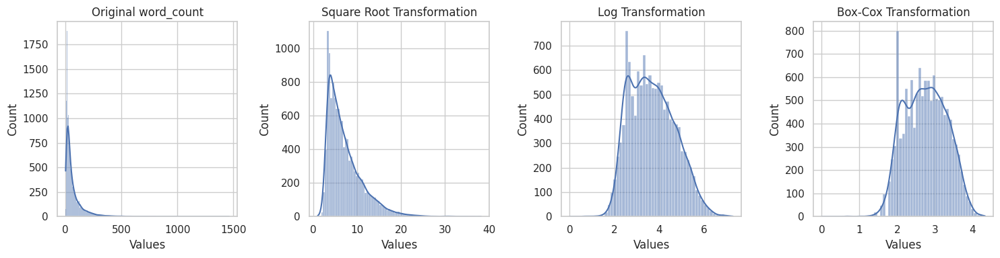

In [160]:
# Create a figure with subplots
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
data = df_train['word_count']
# Original data
sns.histplot(data, kde=True, ax=axes[0])
axes[0].set_title('Original word_count')
axes[0].set_xlabel('Values')

# Square root transformation
sqrt_transformed = np.sqrt(data)
sns.histplot(sqrt_transformed, kde=True, ax=axes[1])
axes[1].set_title('Square Root Transformation')
axes[1].set_xlabel('Values')

# Log transformation
log_transformed = np.log(data)
sns.histplot(log_transformed, kde=True, ax=axes[2])
axes[2].set_title('Log Transformation')
axes[2].set_xlabel('Values')

# Box-Cox transformation
boxcox_transformed, best_lambda = stats.boxcox(data)
sns.histplot(boxcox_transformed, kde=True, ax=axes[3])
axes[3].set_title('Box-Cox Transformation')
axes[3].set_xlabel('Values')

plt.tight_layout()
plt.show()


In [161]:
best_lambda

-0.15754654985142355

The Box-Cox transformation formula is as follows:

$ y = \begin{cases}
    \frac{{x^\lambda - 1}}{\lambda}, & \text{if } x > 0 \\
    \ln(x), & \text{if } x = 0
\end{cases} $

In this formula, \(x\) represents the original data, and \(y\) represents the transformed data. The parameter \(\lambda\) is estimated to make the data as close to a normal distribution as possible.

Log Transformation is simply a case on of the Box-Cox where $\lambda$ is set to 0. As the best lambda calculated is not 0, and Box Cox and Log Transformations give the best results. Box Cox is kept.

In [162]:
df_train['word_count'] = boxcox_transformed
df_train.sample(10)

,categories,publisher,published_year,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count,review
14019,Religion,Harper Collins,2009,2010,1.00,book arrived good time excellent condition cov...,1.391042,6.0,1.857256,5.0
9576,Fiction,Penguin,2006,2009,1.00,watching made television movie based book say ...,1.289899,8.1,2.633041,3.0
10954,Other,Anchor,2004,2011,0.00,enthralled subject polygamy well written book ...,1.531612,5.6,2.837842,2.0
12444,Fiction,Penguin,2005,2006,1.00,nora robert completely outdone novel blue smok...,1.849512,11.9,3.627825,5.0
13284,Fiction,Penguin,2006,2006,0.60,finished vinci code thought would try another ...,0.449515,6.0,2.652179,1.0
7808,Fiction,Other,2009,2013,1.00,book could confusing would better read couple ...,1.024517,3.3,2.159177,3.0
11530,Fiction,Other,2004,2007,1.00,roothee gabay bring next adventure know book g...,0.867889,2.2,2.056219,5.0
222,Fiction,Penguin,2006,2012,1.00,encourage feel koontz steered away horror read...,0.313040,5.5,3.316221,5.0
5709,Fiction,Other,2004,2005,0.75,big fan halo video game wanted know happened f...,1.841094,2.5,2.652179,5.0
10240,Other,Harper Collins,2012,2012,1.00,interesting story insight heck someone end por...,0.830604,6.4,2.056219,5.0


In [163]:
X_test['word_count'], _ = stats.boxcox(X_test['word_count'])

In [164]:

# Create an interactive box plot using Plotly
fig = px.box(df_train, x='review', y='word_count')

fig.update_layout(
    title='Box Plot of Review vs Word Count',
    xaxis_title='Review',
    yaxis_title='Word Count',
    title_x=0.5
)

# Show the interactive plot
fig.show()

## EDA for Review Text Column

In [165]:
pd.set_option('display.max_colwidth', 150)

Original median of Word Count for the most frequent words in the dataset is under 100 words. So 100 words is used as the max_words parameter of the wordclouds.

Word Cloud of most repeated 100 words on reviews with a review Score = 5. 

In [166]:
df_train[df_train['review']==5]['text_clean'].sample(5, random_state=1299)

13963    another princeton success may worried book doe enough information missing thing learned class however everything need know exam took sat biology u...
9565     book coldly logically put felt suspected gov medium time undeniable limelight book reveals new method used medium centric politician quot spin quo...
13059    book used class discussion woman church introduced new way thinking believing god believing beth moore doe excellent job introducing discussing su...
9730     stc provides one straight forward free look screenwriting process tip method help move along writing process whole helping come lean mean screenpl...
4783     found book full excellent tip trick use business world many thing already knew author highlighted thing never even thought example quot unless bet...
Name: text_clean, dtype: object

In [167]:
#FIXME Extraer texto por tipo de categoria

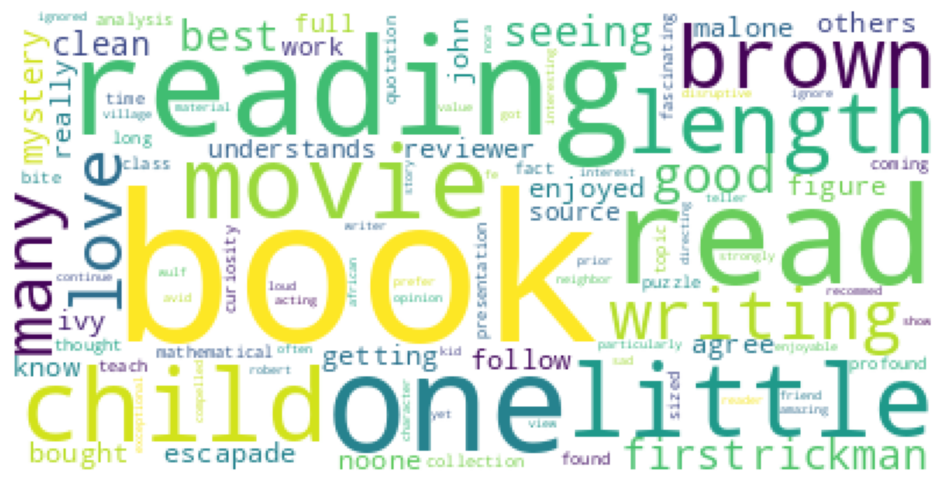

In [168]:
wordcloud5 = WordCloud(max_words=100,  background_color='White',  collocations=False, random_state=1925).generate(str(df_train[df_train['review']==5]['text_clean']))

fig = plt.figure(figsize=(12,12))

plt.axis('off')

plt.imshow(wordcloud5)

plt.show()

More Used words on Reviews with a review Score of 5 includes:book, love, enjoyed, child, read, good, agree, writing, movie. 

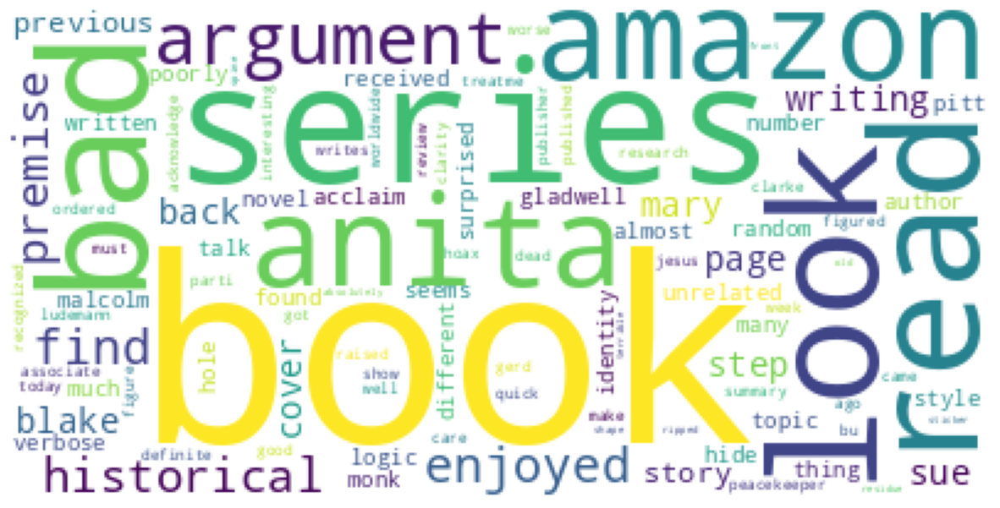

In [169]:
wordcloud1 = WordCloud(max_words=100,  background_color='White', random_state=1925).generate(str(df_train[df_train['review']==1]['text_clean']))

fig = plt.figure(figsize=(15,12))

plt.axis('off')

plt.imshow(wordcloud1)

plt.show()

More Used words on Reviews with a review Score of 1 includes:series, book, look, bad, random, enjoyed, blake, amazon, poorly, surprised.

In [170]:
long_reviews = df_train[df_train['text_clean'].str.len() > 2000].copy()

len(long_reviews)

378

In [171]:
long_reviews.describe().T

,count,mean,std,min,25%,50%,75%,max
published_year,378.0,2006.523810,2.463681,2004.000000,2004.000000,2006.000000,2008.000000,2013.000000
review_year,378.0,2008.595238,2.784512,2004.000000,2006.000000,2009.000000,2011.000000,2013.000000
helpfulness,378.0,0.794980,0.292514,0.000000,0.666667,0.981428,1.000000,1.000000
compound_sentiment,378.0,1.760971,1.970919,-3.597344,1.252114,2.452839,3.159083,4.605120
text_complexity,378.0,10.453968,2.595752,4.700000,8.700000,10.200000,12.000000,22.300000
word_count,378.0,3.867849,0.117940,3.697725,3.780325,3.840110,3.927246,4.333336
review,378.0,4.037037,1.178365,1.000000,3.000000,4.000000,5.000000,5.000000


In [172]:
df_train['word_count'].describe().T

count    12587.000000
mean         2.752771
std          0.551007
min          0.000000
25%          2.321762
50%          2.753759
75%          3.177206
max          4.333336
Name: word_count, dtype: float64


The expected results for FKGL are as follows:

- 0-6: Easy to read, typically understandable by an average 11-year-old student or below.
- 6-8: Readable by a 12-14-year-old student (7th to 8th grade).
- 8-10: Readable by a 14-16-year-old student (9th to 10th grade).
- 10-12: Readable by a 16-18-year-old student (11th to 12th grade).
- 12-14: Readable by a college graduate.
- 14-16: Readable by someone with a post-graduate education.

<Axes: >

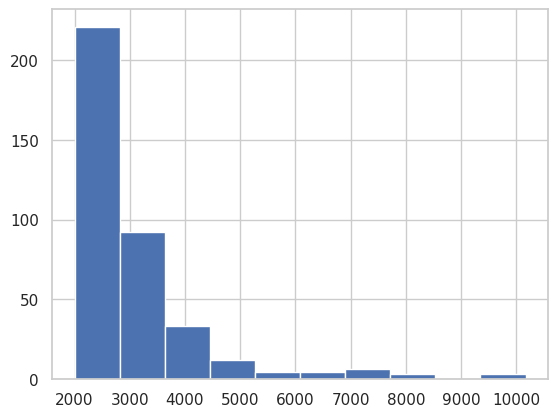

In [173]:
long_reviews['text_clean'].str.len().hist()

In [174]:
short_reviews = df_train[df_train['text_clean'].str.len() < 200].copy()

short_reviews.describe().T

,count,mean,std,min,25%,50%,75%,max
published_year,5300.0,2007.773396,2.789760,2004.000000,2005.000000,2007.000000,2010.000000,2013.000000
review_year,5300.0,2010.540189,2.541092,2004.000000,2009.000000,2012.000000,2012.000000,2013.000000
helpfulness,5300.0,0.813470,0.348096,0.000000,0.800000,1.000000,1.000000,1.000000
compound_sentiment,5300.0,0.915891,0.671533,-2.043879,0.495790,1.008160,1.403008,2.758726
text_complexity,5300.0,5.558849,2.869516,-3.100000,3.600000,5.200000,7.100000,25.900000
word_count,5300.0,2.218645,0.262565,0.000000,2.056219,2.246365,2.447039,2.705566
review,5300.0,4.353019,1.107924,1.000000,4.000000,5.000000,5.000000,5.000000


In [175]:
short_reviews['text_clean'].str.len().mean()

111.32773584905661

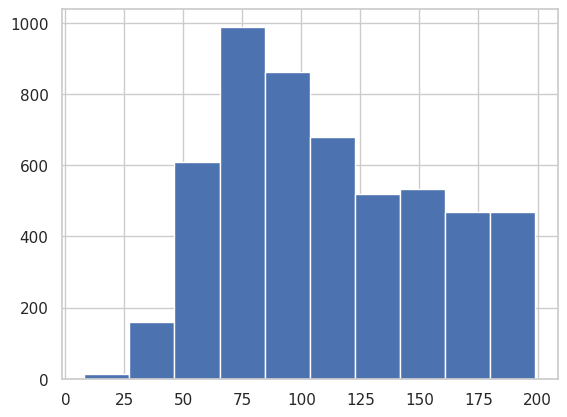

In [176]:
short_reviews['text_clean'].str.len().hist()
plt.show(9)

(0.0, 2500.0)

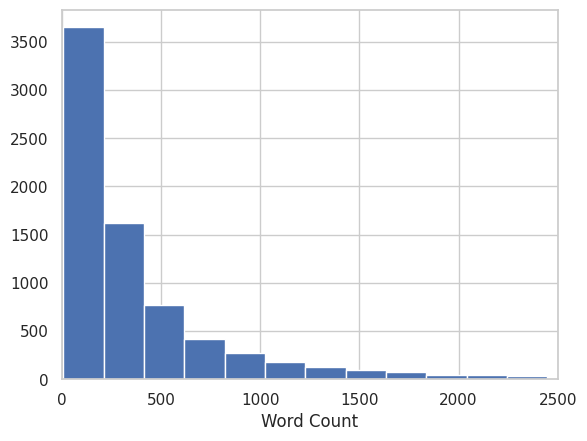

In [177]:
high_reviews = df_train[df_train['review'] == 5].copy()

high_reviews['text_clean'].str.len().hist(bins=50)

plt.xlabel('Word Count')
plt.xlim((0,2500))

In [178]:
neutral_reviews = df_train[df_train['review'] == 3].copy() # Neutral ratings tend to be larger in words count

neutral_reviews['text_clean'].str.len().mean()

584.5882352941177

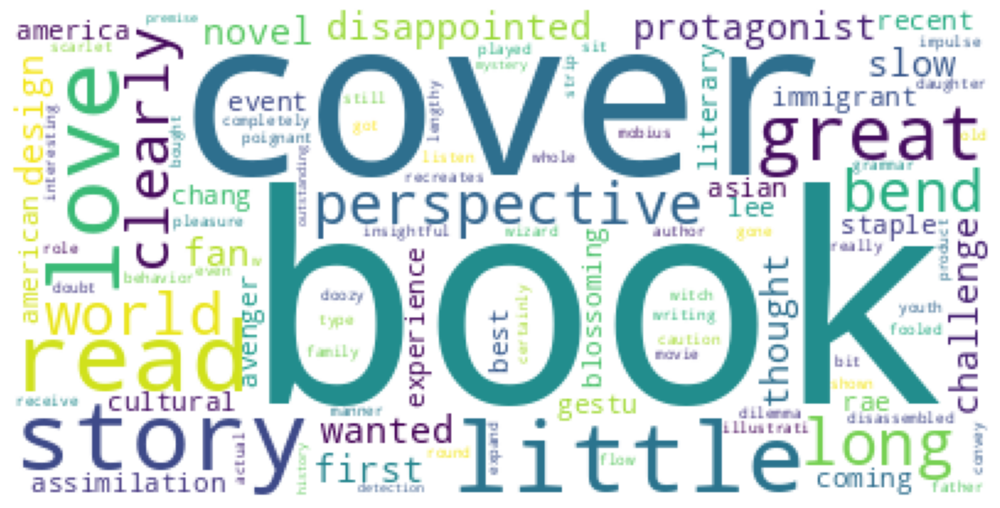

In [179]:
wordcloud3 = WordCloud(max_words=100,  background_color='White').generate(str(neutral_reviews['text_clean']))

fig = plt.figure(figsize=(15,12))

plt.axis('off')

plt.imshow(wordcloud3)

plt.show()

# Multivariable Analysis

In [180]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12587 entries, 5508 to 2317
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   categories          12587 non-null  category
 1   publisher           12587 non-null  category
 2   published_year      12587 non-null  int64   
 3   review_year         12587 non-null  int64   
 4   helpfulness         12587 non-null  float64 
 5   text_clean          12587 non-null  object  
 6   compound_sentiment  12587 non-null  float64 
 7   text_complexity     12587 non-null  float64 
 8   word_count          12587 non-null  float64 
 9   review              12587 non-null  float64 
dtypes: category(2), float64(5), int64(2), object(1)
memory usage: 910.3+ KB


In [181]:
df_train.select_dtypes('number').corr().style.background_gradient(cmap='Blues')

,published_year,review_year,helpfulness,compound_sentiment,text_complexity,word_count,review
published_year,1.000000,0.640374,0.127253,-0.025319,-0.146100,-0.220431,0.072085
review_year,0.640374,1.000000,0.211496,-0.043897,-0.211085,-0.327884,0.085819
helpfulness,0.127253,0.211496,1.000000,0.134475,0.006784,0.025198,0.288476
compound_sentiment,-0.025319,-0.043897,0.134475,1.000000,0.039004,0.233032,0.248840
text_complexity,-0.146100,-0.211085,0.006784,0.039004,1.000000,0.504287,-0.049718
word_count,-0.220431,-0.327884,0.025198,0.233032,0.504287,1.000000,-0.124110
review,0.072085,0.085819,0.288476,0.248840,-0.049718,-0.124110,1.000000


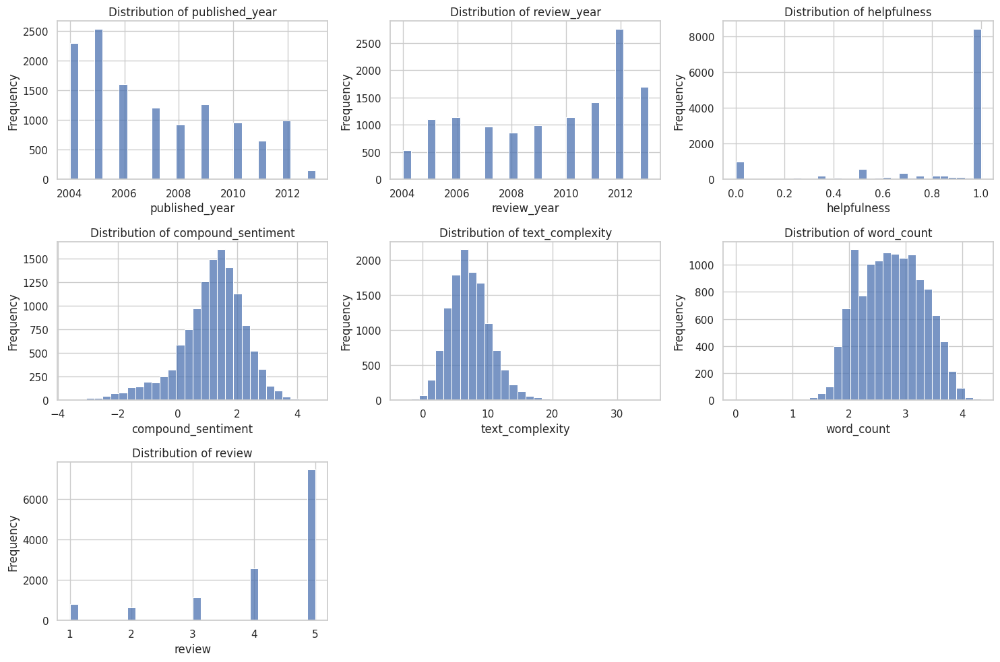

In [182]:
#Histogram with SNS

numerical_features = df_train.select_dtypes(include=['float64', 'int64']).columns

plt.figure(figsize=(15, 10))

for i, feature in enumerate(numerical_features, 1):
    plt.subplot(len(numerical_features)//3 + 1, 3, i)
    sns.histplot(df_train[feature], kde=False, bins=30)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

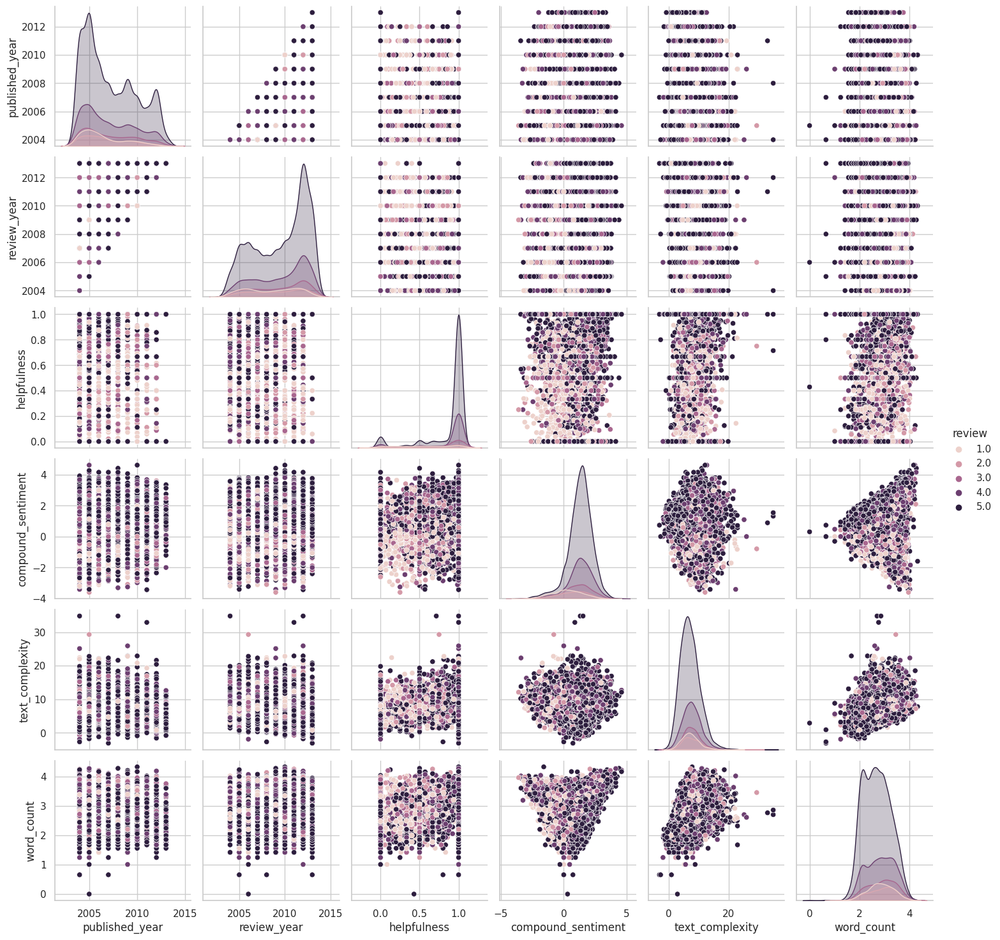

In [183]:
sns.pairplot(data=df_train, hue='review')
plt.show()

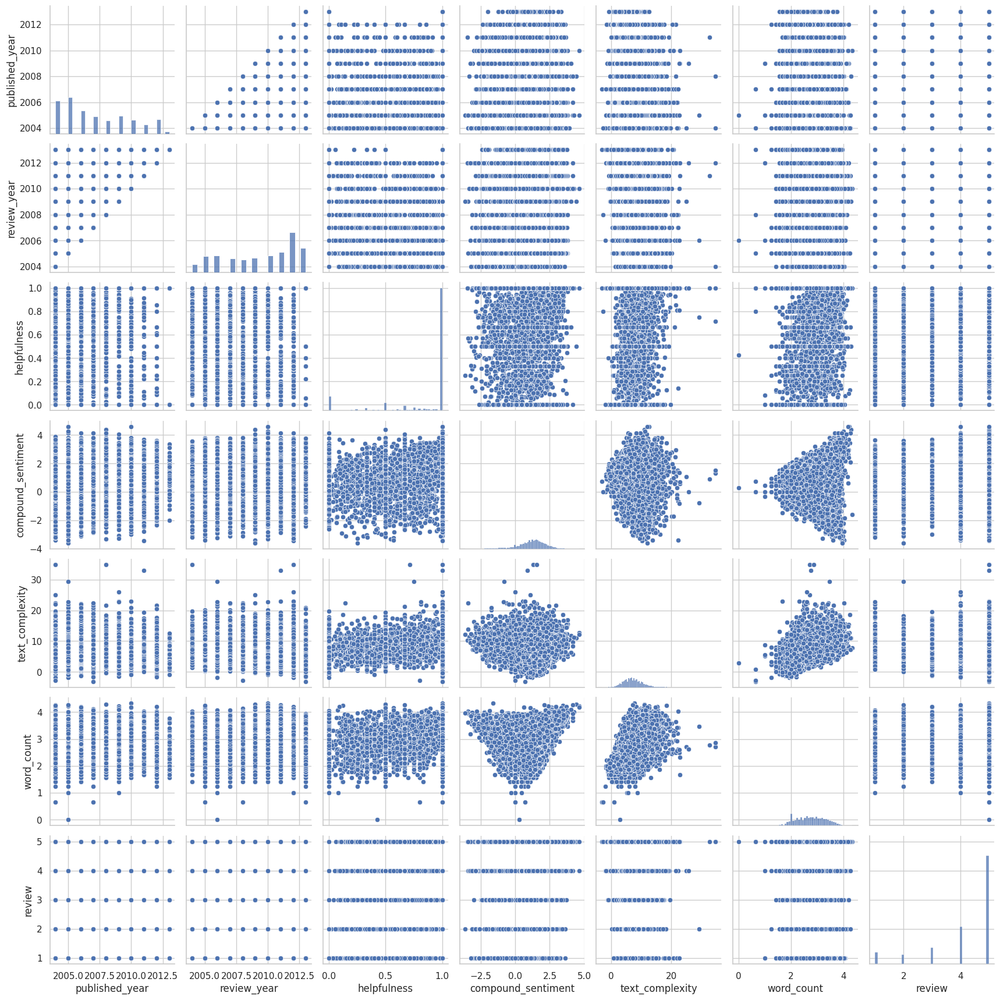

In [184]:
sns.pairplot(data=df_train)
plt.show()

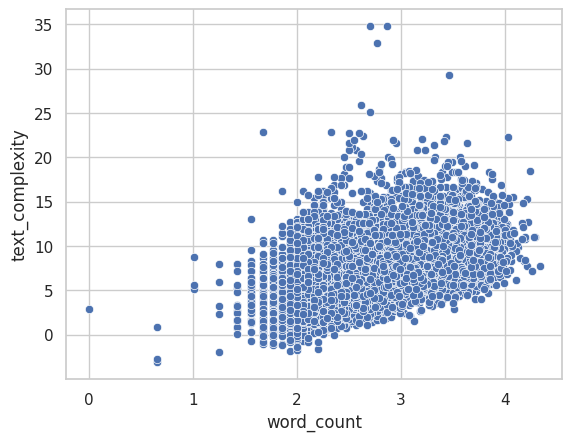

In [185]:
sns.scatterplot(data=df_train, x='word_count', y='text_complexity')
plt.show()

As the word count of the word increases, the text complexity increase

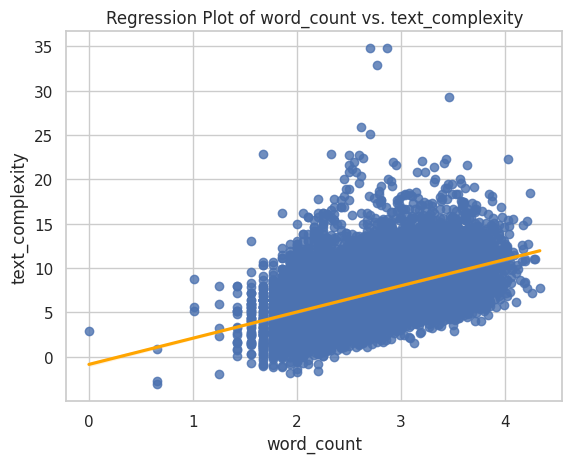

In [186]:
# Create a regression plot
sns.set(style="whitegrid")
sns.regplot(data=df_train, x='word_count', y='text_complexity', line_kws={"color": "orange"})

# Add labels and title
plt.xlabel("word_count")
plt.ylabel("text_complexity")
plt.title("Regression Plot of word_count vs. text_complexity")

# Show the plot
plt.show()

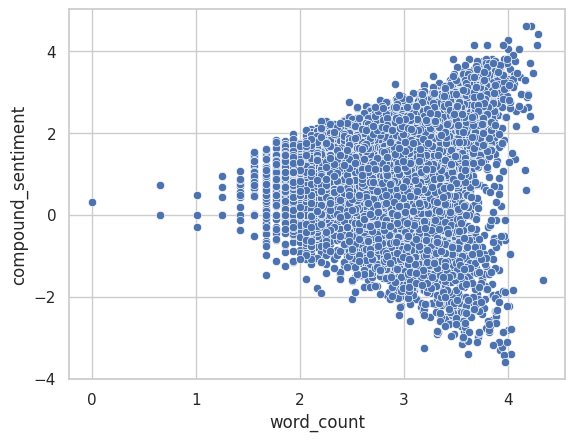

In [187]:
sns.scatterplot(data=df_train, x='word_count', y='compound_sentiment')
plt.show()

For text with less quantity of words, the sentiment tends to be more Neutral. And it tends to be more postive or negative as the word count increases.

# Model Selection, Training and Testing

- The current project is a regression exercise for predicting a continous value for the Review Score of the Review.
- The dataset contains multiple features. Some of the Categorical which are Cateogorical. 
- The dataset contains numerical features, where we have discrete variables and continuos variables.
- Lastly, the dataset contains a text column that will be vectorized.

- Categories and Publisher will be processed with One Hot Encoding

In [188]:
X_train = df_train.drop(['review'], axis=1)

In [189]:
X_train.sample(1)

,categories,publisher,published_year,review_year,helpfulness,text_clean,compound_sentiment,text_complexity,word_count
9404,Other,Other,2005,2005,1.0,truly one best business book read age filled humor timeless truth communicated personal perspective perspective allows reader immediately identify...,2.064304,6.5,2.990271


In [190]:
# Preprocessing for text data
text_vectorizer = TfidfVectorizer()
text_features_train = text_vectorizer.fit_transform(X_train['text_clean'])
text_features_test = text_vectorizer.transform(X_test['text_clean'])

In [191]:
text_features_train

<12587x42612 sparse matrix of type '<class 'numpy.float64'>'
	with 677320 stored elements in Compressed Sparse Row format>

In [192]:
pca = PCA(n_components=15, random_state=2109)

In [193]:
text_features_train_pcaed = pca.fit_transform(text_features_train.toarray())
text_features_test_pcaed = pca.transform(text_features_test.toarray())

In [194]:
text_features_train_pcaed

array([[ 0.01413543,  0.03087141, -0.01621488, ..., -0.03780334,
         0.0075219 ,  0.02734573],
       [-0.03466276, -0.02981061, -0.03364488, ..., -0.03143801,
         0.06298874, -0.02723607],
       [-0.0360264 ,  0.03846522, -0.00412227, ..., -0.00173701,
        -0.01829383, -0.00369131],
       ...,
       [-0.02173876,  0.00345996, -0.00427681, ...,  0.02415778,
         0.01741267, -0.03256531],
       [ 0.05152629, -0.03829256,  0.04181507, ...,  0.01849316,
         0.00252911, -0.04944767],
       [-0.06626858, -0.00166333, -0.00558349, ..., -0.00956263,
        -0.01402989, -0.02174355]])

In [195]:
scaler = StandardScaler()
numerical_features_scaled_train = scaler.fit_transform(X_train[['published_year', 'review_year']])
numerical_features_scaled_test = scaler.transform(X_test[['published_year', 'review_year']])

In [196]:
numerical_features_nonscaled_train = X_train[['helpfulness', 'compound_sentiment','text_complexity','word_count','published_year','review_year']]
numerical_features_nonscaled_test = X_test[['helpfulness', 'compound_sentiment','text_complexity','word_count','published_year','review_year']]

In [197]:
enconder = OneHotEncoder()
categorical_features_train = enconder.fit_transform(X_train[['categories','publisher']])
categorical_features_test = enconder.transform(X_test[['categories','publisher']])

In [229]:
categorical_features_train

AttributeError: __index__ not found

In [199]:
# X_train_final = np.concatenate((text_features_train_pcaed, categorical_features_train.toarray(), numerical_features_scaled_train, numerical_features_nonscaled_train), axis=1)
# X_test_final = np.concatenate((text_features_test_pcaed, categorical_features_test.toarray(), numerical_features_scaled_test, numerical_features_nonscaled_test), axis=1)

X_train_final = np.concatenate((text_features_train_pcaed, categorical_features_train.toarray(), numerical_features_nonscaled_train), axis=1)
X_test_final = np.concatenate((text_features_test_pcaed, categorical_features_test.toarray(), numerical_features_nonscaled_test), axis=1)


# X_train_final = np.concatenate((text_features_train_pcaed, numerical_features_scaled_train, numerical_features_nonscaled_train), axis=1)
# X_test_final = np.concatenate((text_features_test_pcaed, numerical_features_scaled_test, numerical_features_nonscaled_test), axis=1)

# X_train_final = np.concatenate((text_features_train_pcaed, numerical_features_nonscaled_train), axis=1)
# X_test_final = np.concatenate((text_features_test_pcaed, numerical_features_nonscaled_test), axis=1)


In [200]:
X_train_final.shape

(12587, 41)

In [201]:
from sklearn.ensemble import RandomForestRegressor
model_rf = RandomForestRegressor()

In [202]:
model_rf.fit(X_train_final, y_train)

RandomForestRegressor()

In [228]:
feature_names = X_train_final.keys().map(str).to_list()
feature_names

AttributeError: 'numpy.ndarray' object has no attribute 'keys'

In [211]:
# Get feature importances
feature_importances = model_rf.feature_importances_

# Sort the features by importance
sorted_features = sorted(zip(feature_names, feature_importances), key=lambda x: x[1], reverse=True)

In [212]:
sorted_features

[('published_year', 0.06742014293109397),
 ('word_count', 0.06006154054515553),
 ('helpfulness', 0.05590155035035309),
 ('publisher', 0.04112622606707757),
 ('review_year', 0.03534364929042025),
 ('categories', 0.03338673626234657),
 ('text_clean', 0.03326196223676178),
 ('text_complexity', 0.031169563577016824),
 ('compound_sentiment', 0.030556770205651066)]

In [213]:
y_hat_rfr = model_rf.predict(X_test_final)
y_hat_rfr

array([3.93, 4.69, 4.49, ..., 3.42, 4.4 , 3.67])

In [227]:
print(f"Random Forest Regressor: Mean squared error: {np.sqrt(mean_squared_error(y_test, y_hat_rfr)):.4f}")
print(f"Random Forest Regressor: Coefficient of determination: {r2_score(y_test, y_hat_rfr):.4f}")

Random Forest Regressor: Mean squared error: 1.0064
Random Forest Regressor: Coefficient of determination: 0.2897


In [ ]:
# 1. Falta Tunear
# 2. 


In [215]:
y_test.value_counts()

review
5.0    1858
4.0     642
3.0     281
1.0     203
2.0     163
Name: count, dtype: int64

In [217]:
# # Sample DataFrame with discrete actual values and continuous predicted values (replace with your data)
# data = {'y_true': y_test,
#         'Predicted_Value': y_hat_rfr}
# df = pd.DataFrame(data)

# # Calculate the mean predicted value for each category
# mean_predictions = df.groupby('y_true')['Predicted_Value'].mean()

# # Create a scatter plot with mean predicted values
# plt.figure(figsize=(10, 6))
# x = np.arange(len(mean_predictions))
# plt.scatter(x, mean_predictions, color='blue', label='Mean Predicted Value', s=100)
# plt.xticks(x, mean_predictions.index)
# plt.xlabel('Actual Value')
# plt.ylabel('Mean Predicted Value')
# plt.title('Comparison of Mean Predicted Values with Actual Categories')
# plt.legend()
# plt.show()

In [218]:
model_linear_reg = LinearRegression()
model_linear_reg.fit(X_train_final, y_train)

LinearRegression()

In [219]:
feature_coefficients = model_linear_reg.coef_

# Sort the features by coefficient magnitude
sorted_features = sorted(zip(feature_names, feature_coefficients), key=lambda x: abs(x[1]), reverse=True)

sorted_features

[('published_year', 3.38608807988783),
 ('word_count', -2.698492747518723),
 ('helpfulness', 2.188861548749744),
 ('publisher', 1.6599430975429466),
 ('review_year', -1.5064733095228318),
 ('categories', 0.6540744220660023),
 ('text_clean', 0.49407398710915024),
 ('text_complexity', -0.3450766204193724),
 ('compound_sentiment', -0.021972192994757674)]

In [359]:
y_hat_lr = model_linear_reg.predict(X_test_final)
y_hat_lr

array([4.00061113, 4.7315249 , 4.35259658, ..., 3.15997332, 4.68780631,
       3.5721609 ])

In [360]:
print(f'Beta0: {model_linear_reg.intercept_}, Beta1: {model_linear_reg.coef_[0]}')

Beta0: 16.20723952550206, Beta1: 0.6616550653461596


In [361]:
print(f"Linear Regression: Mean squared error: {mean_squared_error(y_test, y_hat_lr):.4f}")
print(f"Linear Regression: Coefficient of determination: {r2_score(y_test, y_hat_lr):.4f}")

Linear Regression: Mean squared error: 1.1171
Linear Regression: Coefficient of determination: 0.2165


In [220]:
model_dtr = DecisionTreeRegressor()
model_dtr.fit(X_train_final, y_train)

DecisionTreeRegressor()

In [222]:
feature_importances = model_dtr.feature_importances_

# Sort the features by importance
sorted_features = sorted(zip(feature_names, feature_importances), key=lambda x: x[1], reverse=True)

sorted_features

[('published_year', 0.06291238468415727),
 ('word_count', 0.05863724563086464),
 ('helpfulness', 0.056739560775222776),
 ('review_year', 0.03954805256490309),
 ('publisher', 0.03909045913459785),
 ('text_clean', 0.03350953875740823),
 ('categories', 0.0301595692393375),
 ('compound_sentiment', 0.02833210123773037),
 ('text_complexity', 0.02680516042107973)]

In [223]:
y_hat_dtr = model_dtr.predict(X_test_final)
y_hat_dtr

array([5., 5., 5., ..., 3., 5., 5.])

In [226]:
print(f"Decision Tree Regressor: Mean squared error: {np.sqrt(mean_squared_error(y_test, y_hat_dtr)):.4f}")
print(f"Decision Tree Regressor: Coefficient of determination: {r2_score(y_test, y_hat_dtr):.4f}")

Decision Tree Regressor: Mean squared error: 1.4033
Decision Tree Regressor: Coefficient of determination: -0.3811


# Testing With Pipeline

In [354]:
# Columns are devided (text, numerical, categorical)
text_columns = ['text_clean'] 
numerical_columns = ['helpfulness', 'compound_sentiment','text_complexity','word_count'] #'published_year', 'review_year' are used as they are
categorical_columns = ['categories','publisher']

def sparse_to_array(X):
        return X.toarray()

# tfidf_to_list = FunctionTransformer(func=sparse_to_list, validate=False)

text_transformer = Pipeline([
    ('tfidf', TfidfVectorizer()),  
    ('to_array', FunctionTransformer(func=sparse_to_array, validate=False)),
    ('pca', PCA(n_components=5))
])

numerical_transformer = Pipeline([
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline([
    ('onehot', OneHotEncoder())
])

preprocessor = ColumnTransformer(
    transformers=[
        ('text', text_transformer, text_columns),
        ('num', numerical_transformer, numerical_columns),
        ('cat', categorical_transformer, categorical_columns)
    ],
    remainder='passthrough'  # Any other columns not specified are passed through as-is
)

preprocess= Pipeline([
    ('preprocessor', preprocessor) # Apply the preprocessor to the specified columns
])

In [355]:
X_train_processed = preprocess.fit(X_test)

ValueError: n_components=5 must be between 0 and min(n_samples, n_features)=1 with svd_solver='full'

In [ ]:
# from sklearn.svm import SVC
# model_svm = SVC(kernel = "rbf", C = 1.0, gamma = 0.5)
# model_svm.fit(X_train_final, y_train)

In [ ]:
# y_pred_svm = model_svm.predict(X_test_final)
# y_pred_svm

In [ ]:
# print(f"SVM: Mean squared error: {mean_squared_error(y_test, y_pred_svm):.4f}")
# print(f"SVM: Coefficient of determination: {r2_score(y_test, y_pred_svm):.4f}")

In [ ]:
# from sklearn.linear_model import LinearRegression, Lasso
# model_ls = Lasso(random_state=2014)

In [ ]:
# model_ls.fit(X_train_final, y_train)

In [ ]:
# y_pred_lasso = model_ls.predict(X_test_final)
# y_pred_lasso

In [ ]:
# print(f"Lasso: Mean squared error: {mean_squared_error(y_test, y_pred_lasso):.4f}")
# print(f"Lasso: Coefficient of determination: {r2_score(y_test, y_pred_lasso):.4f}")

In [ ]:
# label_encoder_publisher = LabelEncoder()

In [ ]:
# vectorizer = TfidfVectorizer(sublinear_tf=True, min_df=5, max_df=1.0)#min_df: Flotante de 0 a 1, Entero: La cuenta. cuantas veces tiene que haber aparecido la palabra para considerarla o eliminar

In [ ]:
# X_train_text_clean_vec = vectorizer.fit_transform(X_train['text_clean'])

In [ ]:
# X_train_text_clean_vec.shape

In [ ]:
# vectorizer.get_feature_names_out()

In [ ]:
# X_train['text_clean_vec']

In [ ]:
# pca = PCA(n_components=5, random_state=2109)
# pca_vecs = pca.fit_transform(X_train_text_clean_vec.toarray())

In [ ]:
# pca_df = pd.DataFrame()

# labels = y_train.reset_index(drop=True)

# pca_df['x_0'] = pca_vecs[:,0] #Todas las filas :,   | Columna 0
# pca_df['x_1'] = pca_vecs[:,1] #Todas las filas :,   | Columna 1
# pca_df['x_2'] = pca_vecs[:,2] #Todas las filas :,   | Columna 1
# pca_df['x_3'] = pca_vecs[:,3] #Todas las filas :,   | Columna 1
# pca_df['x_4'] = pca_vecs[:,4] #Todas las filas :,   | Columna 1
# pca_df['review'] = labels

In [ ]:
# sns.scatterplot(data=pca_df, x='x_3', y='x_4', hue='review')

In [ ]:
# pca_vecs